<a href="https://colab.research.google.com/github/vitroid/yamanashi-water/blob/main/air/nox.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
try:
    # On Google Colab
    from google.colab import drive
    drive.mount('/content/drive')

    BASEDIR="drive/MyDrive/DataAnalysis/相模湖・津久井湖土地・水質/yamanashi-water/air/"
except:
    BASEDIR="./"

,date,19202030,19204010,19206010,19441030
0,2009-04-30,8.324022,14.952450,27.263305,11.263966
1,2009-05-31,6.637838,13.287838,23.317568,8.982432
2,2009-06-30,7.313498,15.226744,19.205594,12.721335
3,2009-07-31,7.240541,15.839189,20.811798,13.851351
4,2009-08-31,7.675676,14.851351,16.679296,11.037838
...,...,...,...,...,...
139,2020-11-30,6.746143,9.415966,22.550459,9.270308
140,2020-12-31,9.385346,11.140921,NaN,11.886179
141,2021-01-31,10.146341,13.330623,27.785150,11.585831
142,2021-02-28,6.644042,9.742081,19.666667,9.360360


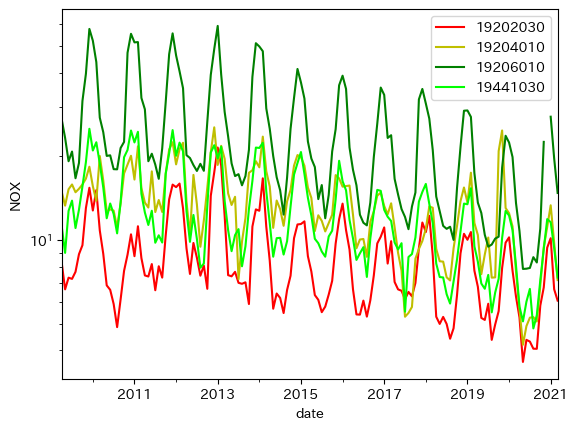

In [3]:
# 指定された局の、全期間のNOX値を抽出する。

import sys
import pandas as pd
import matplotlib.pyplot as plt

fig, ax = plt.subplots()
ax.set_ylabel("NOX")

stations = {"19202030":"r","19204010":"y","19206010":"g","19441030":"lime"}

mdf = []
for station in stations:
    dfs = []
    for year in range(2009, 2021):
        with open(f"{BASEDIR}19/{year}/j19{year}_{station}.csv") as f:
            df = pd.read_csv(f, parse_dates=[1])  # parse date time in column 1
            dfs.append(df)

    dfs = pd.concat(dfs)

    dfs.index = dfs.date

    # 月単位にグループ化します。
    grouped_df = dfs["NOX"].groupby(pd.Grouper(level="date", freq="M"))

    # 各グループの平均値を計算します。
    mean_df = grouped_df.mean()

    # 結果を表示します。
    # print(mean_df)
    mean_df.plot(color=stations[station], ax=ax,label=station)
    mdf.append(mean_df)


mdf = pd.concat(mdf, axis=1)
mdf.columns=stations
mdf = mdf.reset_index(drop=False)

    # plt.plot(mean_df["NOX"])
plt.yscale("log")
plt.legend()
mdf

* これが改良版の大気から相模湖への輸送モデルの$c(t,x)$に相当する。
   * 農地や森からの排出に周期性があるのかと思っていたが、そうではなくインプットの大気のNOX濃度自体が年周振動している。冬場に最大になるのは暖房のせいか?
* 地目面積$A_i$は`land/`で求めた。
* ブロックごとの排出窒素総量$N_{out}(t,x)$は`flow`で求めた。

これらから、地目ごと、月ごとの沈着速度係数$V_i(t)$を推定する。

例えば、12月に限定すれば、
$$N_{out}(\textrm{Dec},\textrm{red})=c(\textrm{Dec},\textrm{red})\sum_{i\in CoL}A_iV_i(\textrm{Dec})$$
|Symbol|Value|
|--|--|
|Dec|12月|
|red|Y-2,Y-3|

$V_i$は地目ごとの変数で、5つある。しかし、集水域は4種類しかない。そのため、$V_i$の値は確定しないのではないか?

In [4]:
len(mean_df)

144

発想を変え、NOX濃度と流域全窒素排出のあいだの相関を見る。

In [31]:
flows = pd.read_csv(f"{BASEDIR}../flow/9bridges2000.csv") # 2000年4月以降の252ヵ月
flows

,Unnamed: 0,"('昭和橋', '流量')","('昭和橋', '全窒素')","('大月橋', '流量')","('大月橋', '全窒素')","('桂川橋', '流量')","('桂川橋', '全窒素')","('富士見橋', '流量')","('富士見橋', '全窒素')","('鶴川橋', '流量')",...,"('西方寺橋', '流量')","('西方寺橋', '全窒素')","('落合橋', '流量')","('落合橋', '全窒素')","('流川', '流量')","('流川', '全窒素')","('道志川', '流量')","('道志川', '全窒素')","('秋山川', '流量')","('秋山川', '全窒素')"
0,0,6.2300,1.60,2.7200,1.60,38.0300,1.4,3.6700,1.30,1.9,...,2.9400,1.40,0.2300,1.40,4.7000,1.6,7.3700,0.55,1.3900,1.20
1,1,4.6400,0.83,1.8000,1.50,24.0900,1.6,3.6900,1.10,1.68,...,1.5800,1.40,0.2000,1.20,2.1500,1.6,3.6300,0.60,1.4300,1.10
2,2,1.6900,1.30,2.6600,1.40,31.3900,1.6,3.2000,1.10,2.68,...,2.6600,1.40,1.1000,1.30,3.7100,1.7,5.0100,0.70,1.8000,1.10
3,3,1.0200,1.60,2.0700,1.70,32.3200,1.6,2.9300,1.20,1.98,...,0.9400,1.30,0.1400,1.30,3.1500,2.2,7.5700,0.88,2.1400,1.50
4,4,0.9700,1.30,5.5200,1.60,39.1000,1.5,2.6200,1.20,0.63,...,0.9900,1.50,0.2600,1.30,2.7500,2.0,3.9600,0.68,0.9300,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,247,7.7105,0.45,6.3106,0.97,39.1846,0.9,7.9972,0.97,2.2060,...,2.0757,0.77,0.9628,0.74,3.6191,1.3,5.5338,0.41,1.4008,0.59
248,248,8.3148,0.38,6.0297,1.00,42.9178,1.0,7.7100,0.94,3.1235,...,2.8151,0.85,0.5278,0.76,3.1508,1.1,7.2997,0.76,2.3027,0.71
249,249,5.7844,0.64,11.3846,0.98,56.6347,1.0,6.5236,1.00,6.4555,...,5.7229,0.89,2.2894,0.75,4.4966,1.2,11.0810,0.44,3.9549,0.64
250,250,4.4277,0.57,2.9422,1.00,35.3546,1.1,4.5551,1.00,1.9370,...,2.4134,0.79,0.7972,0.76,3.2027,1.3,5.7238,0.46,1.5480,0.59


月平均のNOX濃度を別表からとってくる。これで2000年以降の情報がそろう。

In [5]:
import pandas as pd
import numpy as np


# read_csvが読み損じるので、自分で読む。
def read_csv(filename, sep=",", encoding="utf8"):
    rows = []
    with open(filename, encoding=encoding) as f:
        for line in f.readlines():
            cols = line.split(sep)[:143]
            rows.append(cols)
    df = pd.DataFrame(rows[1:])
    df.columns = rows[0][:143]
    print(rows[0][:143])
    return df


cols = """月平均値(ppm)_４月
同左_５月.2
同左_６月.2
同左_７月.2
同左_８月.2
同左_９月.2
同左_10月.2
同左_11月.2
同左_12月.2
同左_１月.2
同左_２月.2
同左_３月.2
""".splitlines()

# 2008年のデータはコラム名をつけまちがっている!!!信じられん。

stations = [19202030, 19204010, 19206010]

nox = []
for year in range(2000, 2021):
    if year >= 2003:
        cols = "月平均値(ppm)_４月,月平均値(ppm)_５月,月平均値(ppm)_６月,月平均値(ppm)_７月,月平均値(ppm)_８月,月平均値(ppm)_９月,月平均値(ppm)_10月,月平均値(ppm)_11月,月平均値(ppm)_12月,月平均値(ppm)_１月,月平均値(ppm)_２月,月平均値(ppm)_３月".split(
            ","
        )
    filename = f"{BASEDIR}../TD20231218_155555_51/TD{year}0419.txt"
    cols_in_file = list(
        pd.read_csv(
            filename,
            sep=",",
            nrows=1,
            encoding="cp932",
        )
    )
    print(len(cols_in_file))
    df = pd.read_csv(
        filename,
        encoding="cp932",
        sep=",",
        usecols=cols_in_file,
    )
    df = df.loc[:, ~df.columns.duplicated()]
    print(year, df)
    for i, col in enumerate(cols):
        month = i + 4
        y = year
        if month > 12:
            y += 1
            month -= 12
        row = []
        for station in stations:
            rows = df[df["測定局コード"] == station]
            if len(rows) > 0:
                row.append(rows.iloc[0][col])
            else:
                row.append(np.NaN)
        print(row)
        nox.append([float(x) for x in row])

nox = pd.DataFrame(nox, columns=stations)

nox

175
2000     測定年度  項目種類コード  項目コード_数字 項目コード_英数字  測定方法コード  都道府県コード 都道府県名        同左_ローマ字  \
0   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
1   2000        1         4       NOX        2       19   山梨県  Yamanashi-keｎ   
2   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
3   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
4   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
5   2000        1         4       NOX        2       19   山梨県  Yamanashi-keｎ   
6   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
7   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
8   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
9   2000        1         4       NOX        1       19   山梨県  Yamanashi-keｎ   
10  2000        1         4       NOX        2       19   山梨県  Yamanashi-keｎ   

    市区町村コード  市区町村名  ... Unname

,19202030,19204010,19206010
0,0.011,0.024,0.030
1,0.009,0.027,0.024
2,0.011,0.029,0.027
3,0.010,0.023,0.023
4,0.011,0.023,0.022
...,...,...,...
247,0.007,0.009,0.023
248,0.009,0.011,NaN
249,0.010,0.013,0.028
250,0.007,0.010,0.020


<Axes: >

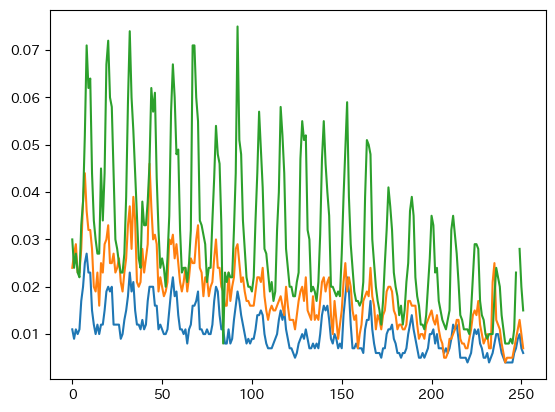

In [7]:
nox[19202030].plot()
nox[19204010].plot()
nox[19206010].plot()


In [26]:
flows = pd.read_csv(f"{BASEDIR}../flow/9bridges2000.csv") # 2000年4月以降の252ヵ月
flows

,Unnamed: 0,"('昭和橋', '流量')","('昭和橋', '全窒素')","('大月橋', '流量')","('大月橋', '全窒素')","('桂川橋', '流量')","('桂川橋', '全窒素')","('富士見橋', '流量')","('富士見橋', '全窒素')","('鶴川橋', '流量')",...,"('西方寺橋', '流量')","('西方寺橋', '全窒素')","('落合橋', '流量')","('落合橋', '全窒素')","('流川', '流量')","('流川', '全窒素')","('道志川', '流量')","('道志川', '全窒素')","('秋山川', '流量')","('秋山川', '全窒素')"
0,0,6.2300,1.60,2.7200,1.60,38.0300,1.4,3.6700,1.30,1.9,...,2.9400,1.40,0.2300,1.40,4.7000,1.6,7.3700,0.55,1.3900,1.20
1,1,4.6400,0.83,1.8000,1.50,24.0900,1.6,3.6900,1.10,1.68,...,1.5800,1.40,0.2000,1.20,2.1500,1.6,3.6300,0.60,1.4300,1.10
2,2,1.6900,1.30,2.6600,1.40,31.3900,1.6,3.2000,1.10,2.68,...,2.6600,1.40,1.1000,1.30,3.7100,1.7,5.0100,0.70,1.8000,1.10
3,3,1.0200,1.60,2.0700,1.70,32.3200,1.6,2.9300,1.20,1.98,...,0.9400,1.30,0.1400,1.30,3.1500,2.2,7.5700,0.88,2.1400,1.50
4,4,0.9700,1.30,5.5200,1.60,39.1000,1.5,2.6200,1.20,0.63,...,0.9900,1.50,0.2600,1.30,2.7500,2.0,3.9600,0.68,0.9300,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,247,7.7105,0.45,6.3106,0.97,39.1846,0.9,7.9972,0.97,2.2060,...,2.0757,0.77,0.9628,0.74,3.6191,1.3,5.5338,0.41,1.4008,0.59
248,248,8.3148,0.38,6.0297,1.00,42.9178,1.0,7.7100,0.94,3.1235,...,2.8151,0.85,0.5278,0.76,3.1508,1.1,7.2997,0.76,2.3027,0.71
249,249,5.7844,0.64,11.3846,0.98,56.6347,1.0,6.5236,1.00,6.4555,...,5.7229,0.89,2.2894,0.75,4.4966,1.2,11.0810,0.44,3.9549,0.64
250,250,4.4277,0.57,2.9422,1.00,35.3546,1.1,4.5551,1.00,1.9370,...,2.4134,0.79,0.7972,0.76,3.2027,1.3,5.7238,0.46,1.5480,0.59


In [9]:
# Google Colab
! pip install japanize_matplotlib


[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: pip install --upgrade pip


[[1.         0.47462818]
 [0.47462818 1.        ]]


/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/4017699571.py:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.scatter(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"],
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/4017699571.py:10: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  print(np.corrcoef(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"]))
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/4017699571.py:11: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  a, b = np.polyfit(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"], 1)


Text(0.5, 1.0, '桂川橋')

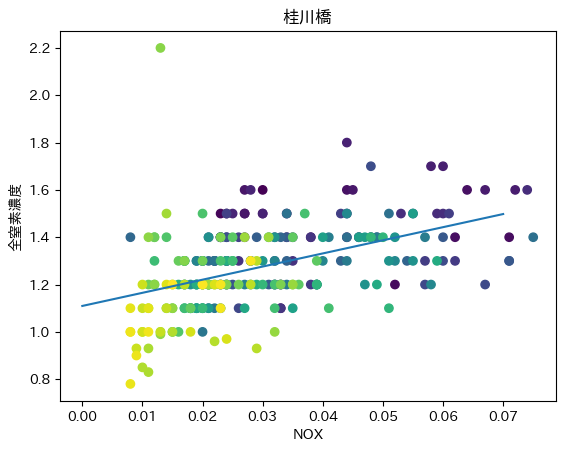

In [10]:
import matplotlib.pyplot as plt
import japanize_matplotlib

plt.scatter(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"],
                c=flows.index,
    cmap="viridis",
    vmin=0,
    vmax=251,
)
print(np.corrcoef(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"]))
a, b = np.polyfit(nox[19206010].fillna(method="ffill").to_numpy(), flows["('桂川橋', '全窒素')"], 1)
X = np.linspace(0,0.07,100)
plt.plot(X, X*a+b, "-")
plt.xlabel("NOX")
plt.ylabel("全窒素濃度")
plt.title("桂川橋")

/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/810034348.py:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.scatter(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"],
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/810034348.py:7: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  print(np.corrcoef(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"]))
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/810034348.py:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  a, b = np.polyfit(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"], 1)


[[1.         0.41450748]
 [0.41450748 1.        ]]


Text(0.5, 1.0, '富士見橋')

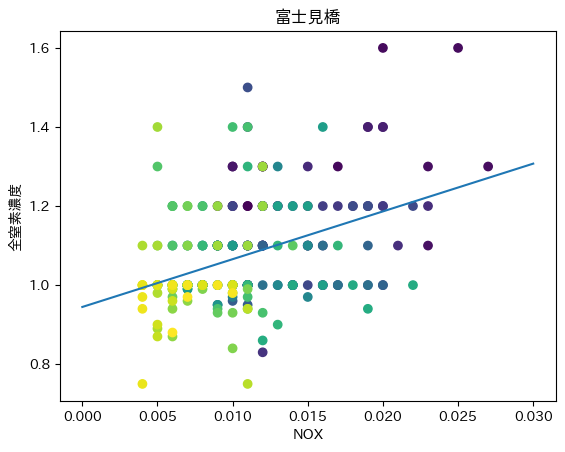

In [11]:
plt.scatter(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"],
                c=flows.index,
    cmap="viridis",
    vmin=0,
    vmax=251,
)
print(np.corrcoef(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"]))
a, b = np.polyfit(nox[19202030].fillna(method="ffill").to_numpy(), flows["('富士見橋', '全窒素')"], 1)
X = np.linspace(0,0.03,100)
plt.plot(X, X*a+b, "-")
plt.xlabel("NOX")
plt.ylabel("全窒素濃度")
plt.title("富士見橋")

[[1.         0.62693065]
 [0.62693065 1.        ]]


/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/1573897305.py:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.scatter(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"],
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/1573897305.py:7: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  print(np.corrcoef(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"]))
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/1573897305.py:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  a, b = np.polyfit(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"], 1)


Text(0.5, 1.0, '大月橋')

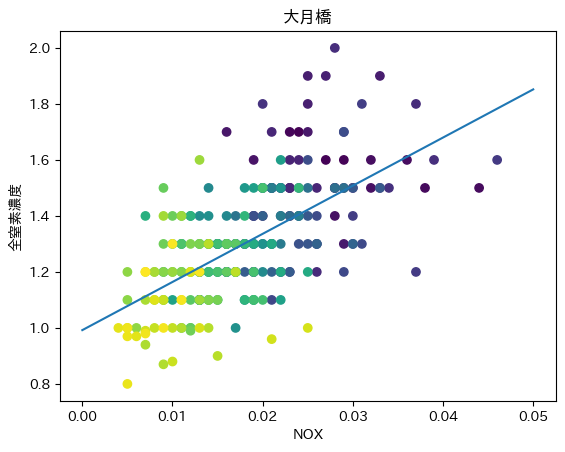

In [12]:
plt.scatter(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"],
                c=flows.index,
    cmap="viridis",
    vmin=0,
    vmax=251,
)
print(np.corrcoef(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"]))
a, b = np.polyfit(nox[19204010].fillna(method="ffill").to_numpy(), flows["('大月橋', '全窒素')"], 1)
X = np.linspace(0,0.05,100)
plt.plot(X, X*a+b, "-")
plt.xlabel("NOX")
plt.ylabel("全窒素濃度")
plt.title("大月橋")

In [13]:
a,b

(17.19496782347407, 0.9921505074734654)

/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/26472103.py:1: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[0:12], flows["('昭和橋', '全窒素')"][:12])
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/26472103.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[12:24], flows["('昭和橋', '全窒素')"][12:24])
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/26472103.py:3: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[24:36], flows["('昭和橋', '全窒素')"][24:36])
/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/26

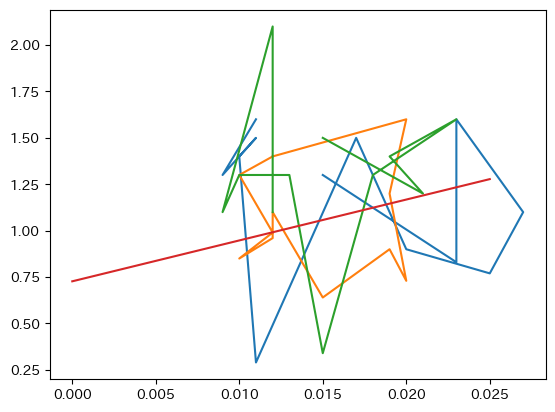

In [14]:

plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[0:12], flows["('昭和橋', '全窒素')"][:12])
plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[12:24], flows["('昭和橋', '全窒素')"][12:24])
plt.plot(nox[19202030].fillna(method="ffill").to_numpy()[24:36], flows["('昭和橋', '全窒素')"][24:36])
# plt.scatter(nox.fillna(method="ffill").to_numpy(), flows["('昭和橋', '全窒素')"],
#                 c=flows.index,
#     cmap="viridis",
#     vmin=0,
#     vmax=251,
# )
np.corrcoef(nox[19202030].fillna(method="ffill").to_numpy(), flows["('昭和橋', '全窒素')"])
a, b = np.polyfit(nox[19202030].fillna(method="ffill").to_numpy(), flows["('昭和橋', '全窒素')"], 1)
X = np.linspace(0,0.025,100)
plt.plot(X, X*a+b, "-")


In [15]:
a,b

(22.021400590335386, 0.72721370871452)

In [16]:
nox.fillna(method="ffill").to_numpy()

/var/folders/g2/t_qwkbf48xj4860059bm17mh0000gs/T/ipykernel_81650/611333846.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  nox.fillna(method="ffill").to_numpy()


array([[0.011, 0.024, 0.03 ],
       [0.009, 0.027, 0.024],
       [0.011, 0.029, 0.027],
       [0.01 , 0.023, 0.023],
       [0.011, 0.023, 0.022],
       [0.017, 0.028, 0.033],
       [0.02 , 0.038, 0.038],
       [0.025, 0.044, 0.052],
       [0.027, 0.036, 0.071],
       [0.023, 0.032, 0.062],
       [0.023, 0.032, 0.064],
       [0.015, 0.028, 0.044],
       [0.012, 0.02 , 0.034],
       [0.01 , 0.019, 0.03 ],
       [0.012, 0.023, 0.027],
       [0.01 , 0.016, 0.027],
       [0.012, 0.025, 0.045],
       [0.012, 0.023, 0.034],
       [0.015, 0.029, 0.044],
       [0.019, 0.03 , 0.067],
       [0.02 , 0.033, 0.072],
       [0.019, 0.025, 0.06 ],
       [0.02 , 0.025, 0.058],
       [0.012, 0.027, 0.044],
       [0.012, 0.023, 0.03 ],
       [0.012, 0.024, 0.028],
       [0.012, 0.026, 0.025],
       [0.009, 0.021, 0.023],
       [0.01 , 0.019, 0.023],
       [0.013, 0.023, 0.027],
       [0.015, 0.026, 0.039],
       [0.018, 0.033, 0.059],
       [0.023, 0.037, 0.074],
       [0.

2変数線形回帰により、背景と大気質依存成分を分離する。

In [7]:
flows = pd.read_csv(f"{BASEDIR}../flow/9bridges2000.csv") # 2000年4月以降の252ヵ月
flows

,Unnamed: 0,"('昭和橋', '流量')","('昭和橋', '全窒素')","('大月橋', '流量')","('大月橋', '全窒素')","('桂川橋', '流量')","('桂川橋', '全窒素')","('富士見橋', '流量')","('富士見橋', '全窒素')","('鶴川橋', '流量')",...,"('西方寺橋', '流量')","('西方寺橋', '全窒素')","('落合橋', '流量')","('落合橋', '全窒素')","('流川', '流量')","('流川', '全窒素')","('道志川', '流量')","('道志川', '全窒素')","('秋山川', '流量')","('秋山川', '全窒素')"
0,0,1.0200,1.60,2.0700,1.7,32.3200,1.6,2.9300,1.20,1.9800,...,0.9400,1.30,0.1400,1.30,3.1500,2.2,7.5700,0.88,2.1400,1.50
1,1,0.9700,1.30,5.5200,1.6,39.1000,1.5,2.6200,1.20,0.6300,...,0.9900,1.50,0.2600,1.30,2.7500,2.0,3.9600,0.68,0.9300,1.00
2,2,0.5700,1.50,2.3100,1.6,48.7000,1.5,2.3800,1.20,0.3500,...,0.7400,1.20,0.1200,1.40,2.7900,1.8,1.7900,0.63,0.3800,1.00
3,3,1.3400,1.40,5.3000,1.7,41.0000,1.5,3.8500,1.30,2.3200,...,2.4800,1.00,0.5500,1.20,2.7300,1.8,5.4700,0.70,2.1700,1.20
4,4,5.1800,0.29,4.8000,1.4,43.9800,1.3,4.3100,1.10,1.5800,...,1.8400,0.95,0.3300,1.20,3.5300,1.5,5.1900,0.62,1.3300,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,247,4.4277,0.57,2.9422,1.0,35.3546,1.1,4.5551,1.00,1.9370,...,2.4134,0.79,0.7972,0.76,3.2027,1.3,5.7238,0.46,1.5480,0.59
248,248,4.4304,0.66,2.2754,1.1,32.6497,1.2,4.5471,1.00,0.8985,...,1.2589,0.75,0.1979,0.83,1.7326,1.2,2.8614,0.37,0.6905,0.58
249,249,0.9716,1.30,1.8195,1.2,23.0379,1.3,4.8280,0.98,0.4651,...,1.0088,0.98,0.1561,0.83,1.4969,1.4,2.0964,0.40,0.4306,0.64
250,250,1.8441,1.00,1.6346,1.3,22.1846,1.2,4.7207,0.97,0.4367,...,0.9354,1.10,0.0587,0.88,1.5867,1.3,1.9493,0.44,0.4629,0.70


In [27]:
import numpy as np
import scipy
import japanize_matplotlib
import plotly.graph_objects as go
import plotly.io as pio


def trend(cF, B, C, D, E):
    c, F = cF
    return c * (B + C * F) + D + E * F


bridges = {
    "昭和橋": 19202030,
    "富士見橋": 19202030,
    "大月橋": 19204010,
    "桂川橋": 19206010,
    "鶴川橋": 19206010,
    "西方寺橋": 19206010,
    "落合橋": 19206010,
    "流川": 19206010,
    "道志川": 19206010,
    "秋山川": 19206010,
}

for bridge, station in bridges.items():
    flowcol = f"('{bridge}', '流量')"
    noxcol = f"('{bridge}', '全窒素')"

    # NOX in the air
    c = nox[station].ffill()

    # River flow
    F = flows[flowcol]

    # N load
    N = flows[flowcol] * flows[noxcol]

    popt, pcov = scipy.optimize.curve_fit(trend, (c, F), N)
    print(popt)

    X = np.linspace(0, np.max(c), 100)
    Y = np.linspace(0, np.max(F), 100)
    X, Y = np.meshgrid(X, Y)
    Z = trend((X, Y), *popt)

    surface = go.Surface(
        x=X,
        y=Y,
        z=Z,
        colorscale="Viridis",
    )

    rawdata = go.Scatter3d(x=c, y=F, z=N, mode="markers")

    mobile = go.Surface(
        x=X, y=Y, z=trend((X, Y), popt[0], popt[1], 0, 0), colorscale="blues"
    )

    static = go.Surface(
        x=X,
        y=Y,
        z=trend((X, Y), 0, 0, popt[2], popt[3]),
        colorscale="greens",
    )

    fig = go.Figure(data=[surface, rawdata, mobile, static])
    fig.update_layout(
        scene=dict(
            xaxis_title="c",
            yaxis_title="F",
            zaxis_title="N",
        ),
        title=dict(text=bridge),
    )
    fig.show()
    pio.write_html(fig, file=f"{bridge}.html", auto_open=True)

[43.34957305 -4.84055754  0.40477502  0.48993349]


[ 2.46084321 12.57839802  0.08696222  0.92006705]


[20.24286542  7.84200842  0.15725125  1.01301604]


[178.60589684  -4.14901084  -9.18568458   1.51259374]


TypeError: can't multiply sequence by non-int of type 'float'

オレンジの点は実測値、一番上の面がフィッティング、緑の面が大気以外(畑と森)からの寄与(流量のみに依存するので平坦)、青が大気からの寄与(流量FとNOX濃度cの両方に依存するので曲がる)



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[3.66007779 2.62737657 2.03166487 1.64668615 1.37869266 1.18206903
 1.03204668 0.91405554 0.81898404 0.74085181]


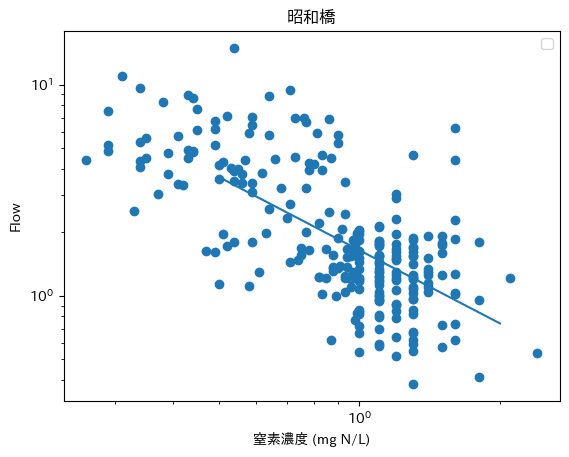

-1.1523087028918282 0.4987648730350137 [[ 1.         -0.59003393]
 [-0.59003393  1.        ]]


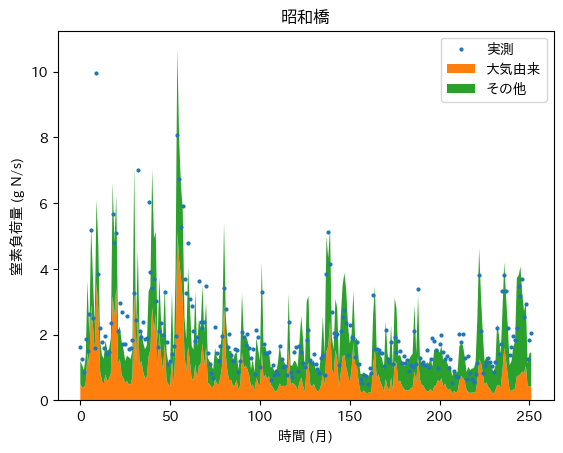

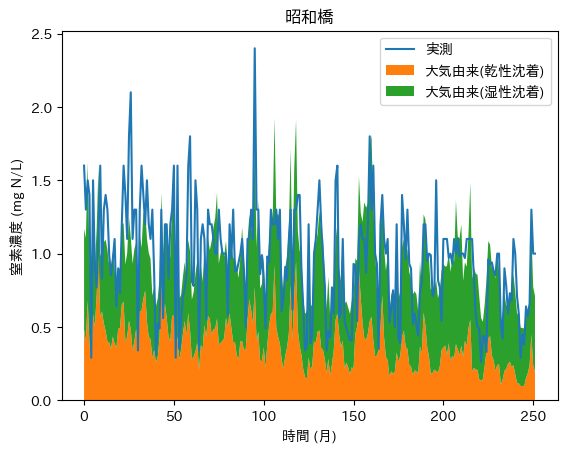

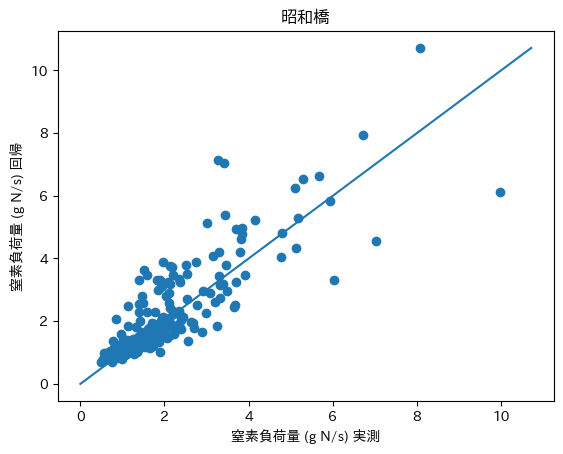

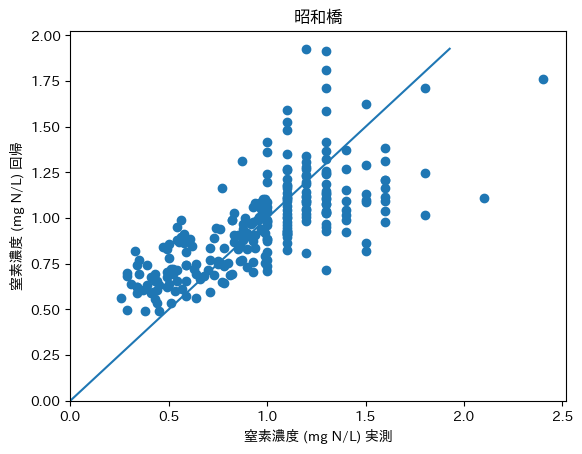

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[3.44562502 3.72821992 3.9632831  4.16630389 4.34604804 4.50800567
 4.65586486 4.79223412 4.91903282 5.03771826]


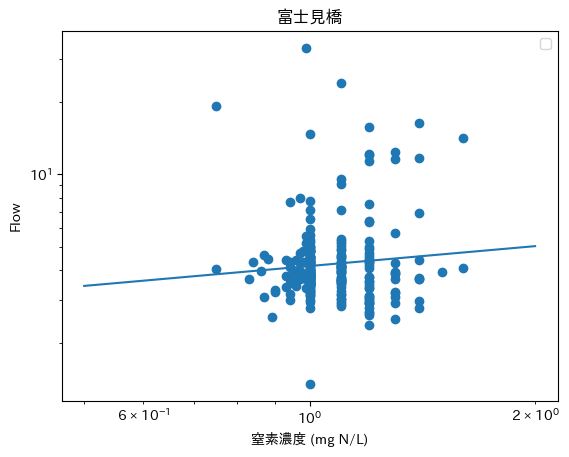

0.2740023672563734 1.4270292852867583 [[1.         0.09726199]
 [0.09726199 1.        ]]


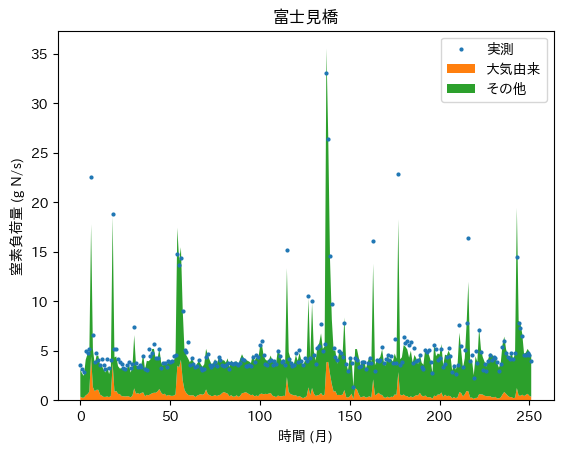

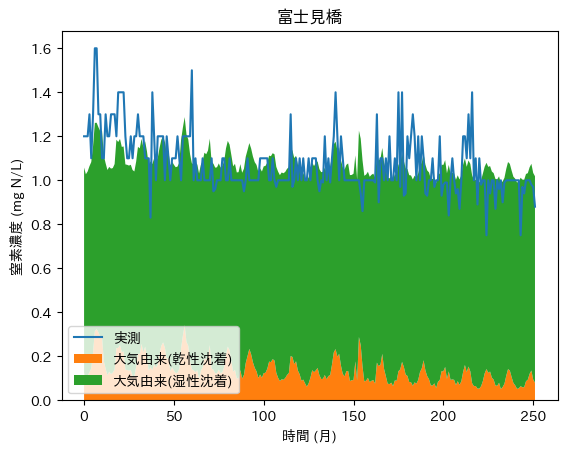

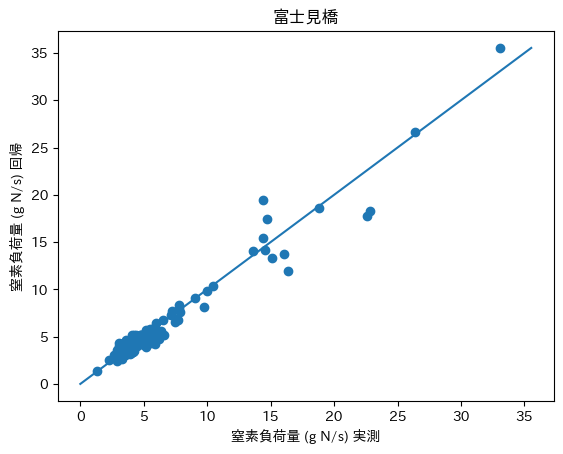

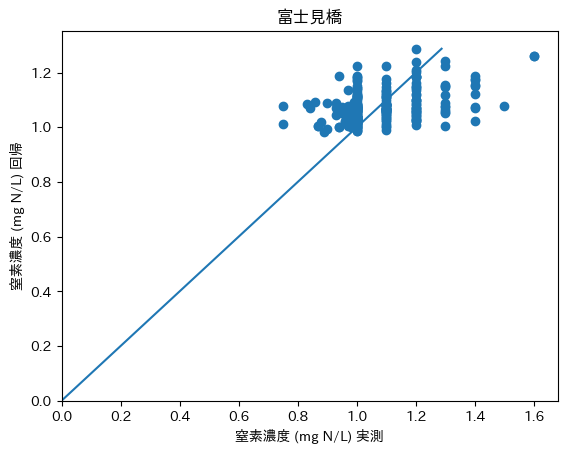

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[13.44484633  9.2916736   6.97637839  5.51995584  4.52849812  3.81481697
  3.27927064  2.86424253  2.53424235  2.26628938]


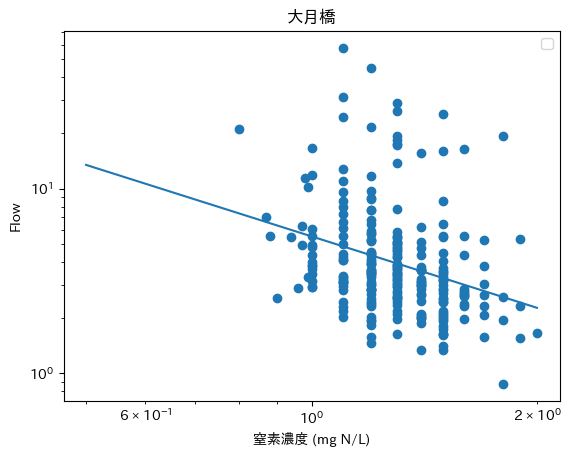

-1.2843246352970445 1.7083698600650938 [[ 1.         -0.17684961]
 [-0.17684961  1.        ]]


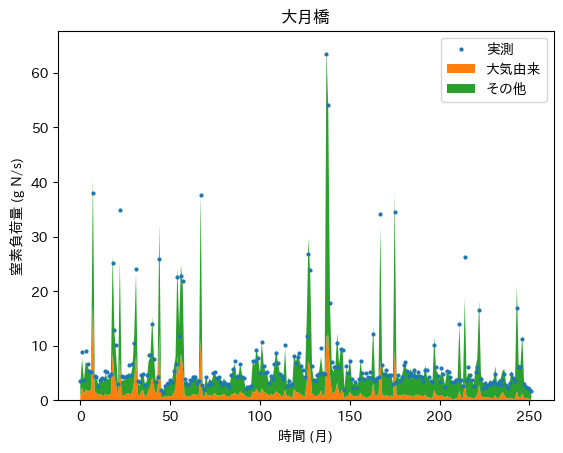

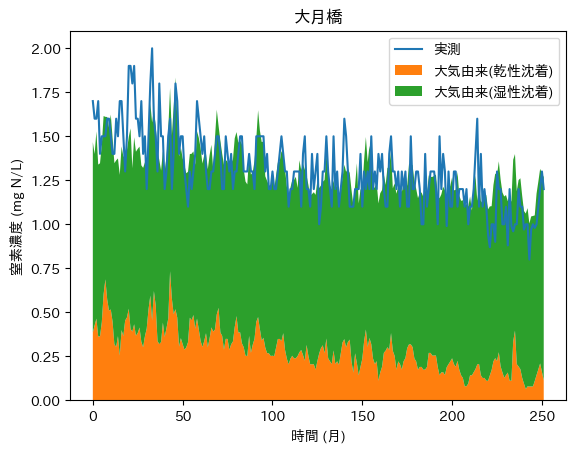

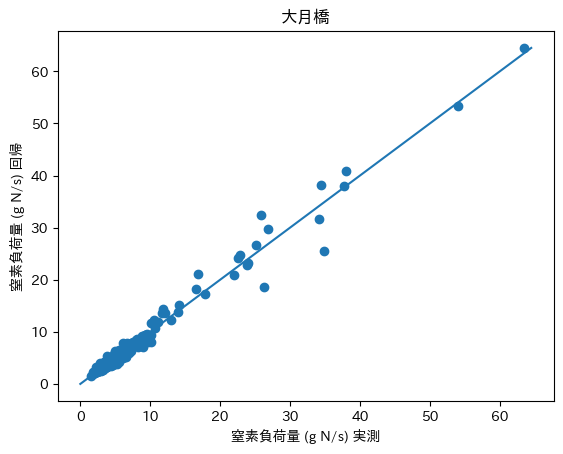

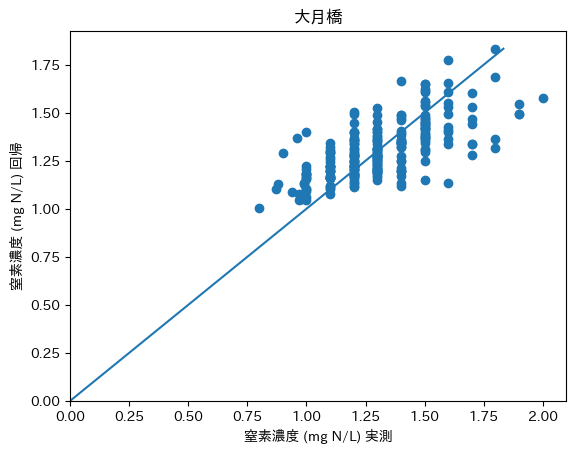

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[56.09983807 48.16669385 42.79437337 38.85280339 35.80486502 33.35858267
 31.33991999 29.63789972 28.17800329 26.90810496]


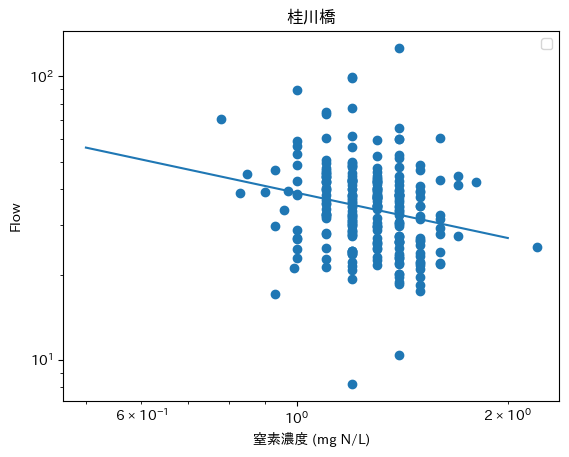

-0.5299779078405353 3.6597802335070804 [[ 1.         -0.19726978]
 [-0.19726978  1.        ]]


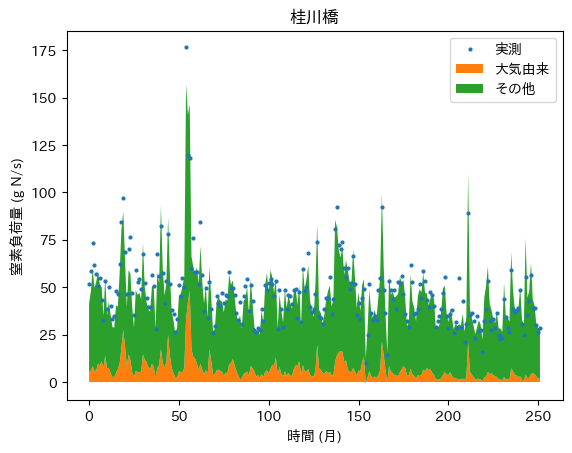

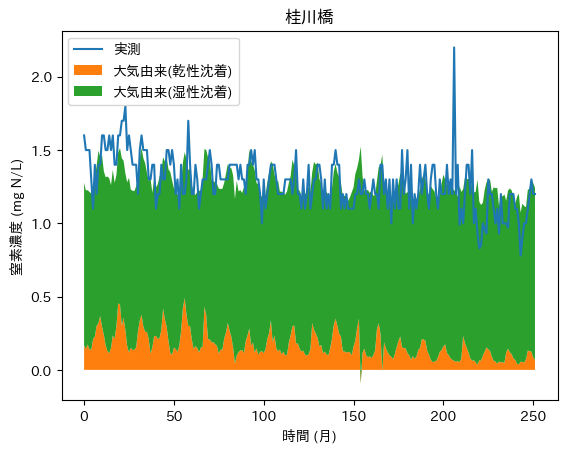

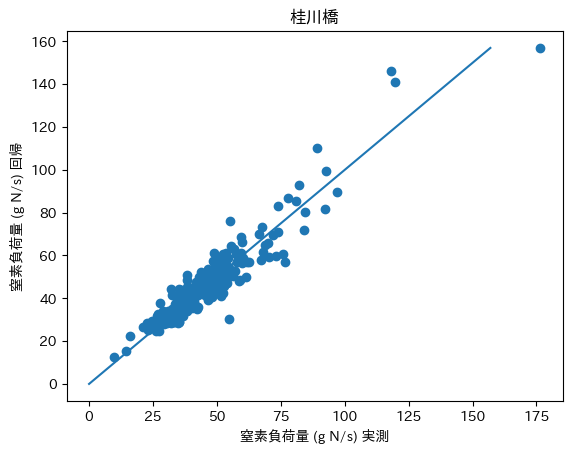

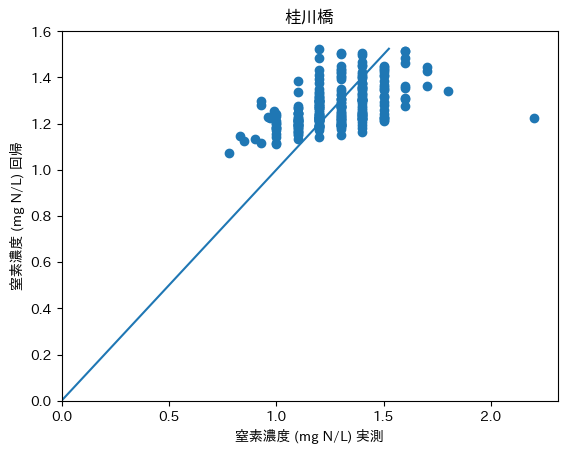

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[2.52490514 2.1365417  1.87693775 1.6884215  1.54388391 1.42872018
 1.33429044 1.25512123 1.18755842 1.12905911]


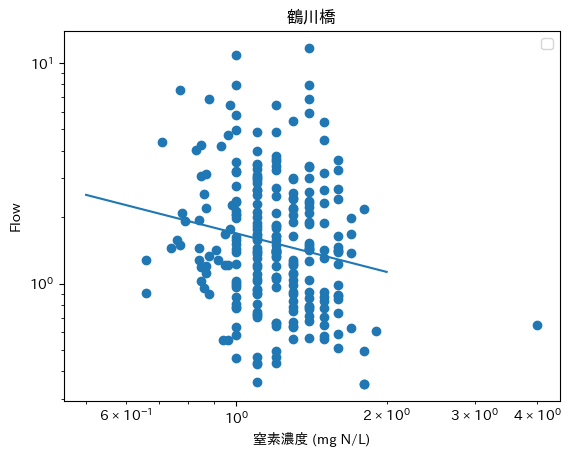

-0.5805540840390366 0.5237940687505014 [[ 1.         -0.13081494]
 [-0.13081494  1.        ]]


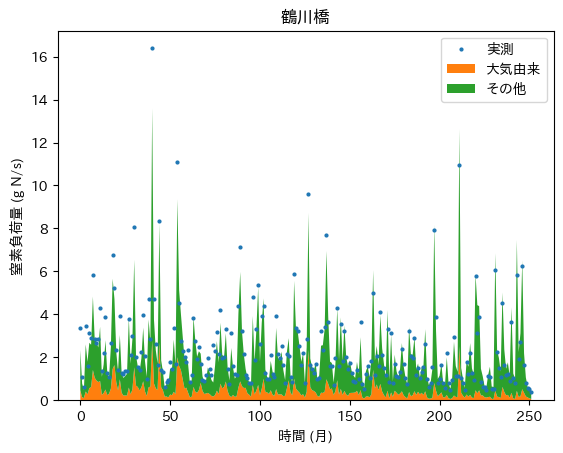

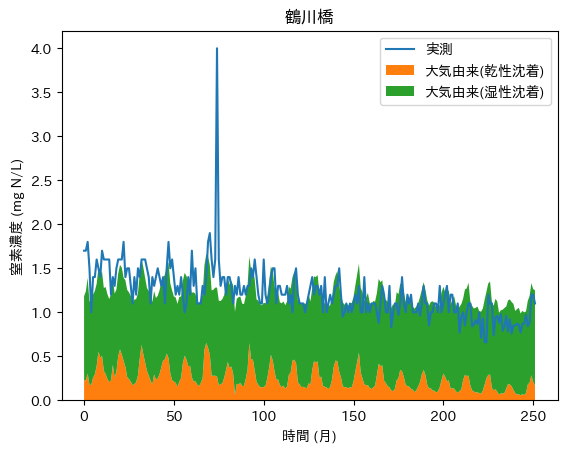

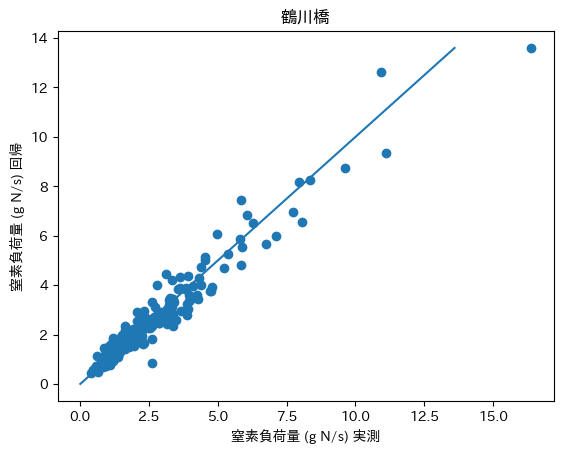

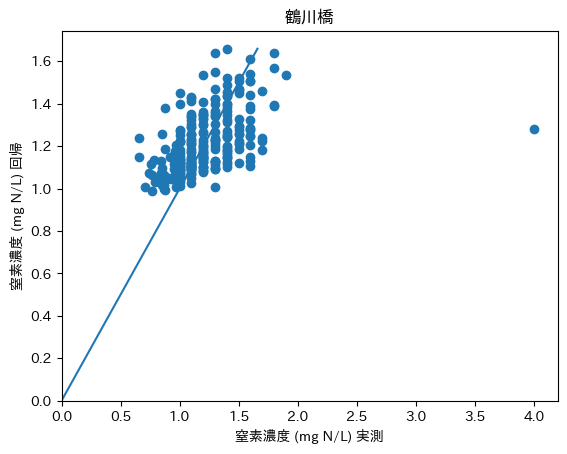

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[1.55812989 1.62103882 1.67157868 1.71404024 1.75078138 1.78324399
 1.81237729 1.838841   1.86311306 1.88555136]


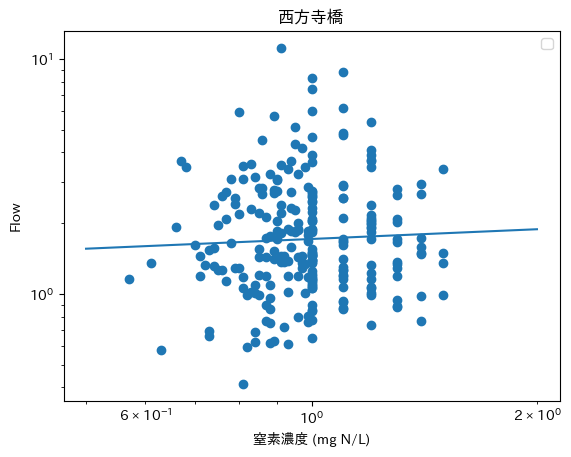

0.13758547311443492 0.5388532966740087 [[1.         0.00709625]
 [0.00709625 1.        ]]


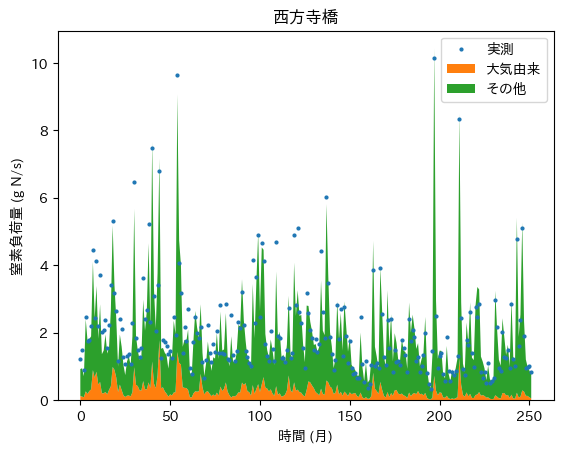

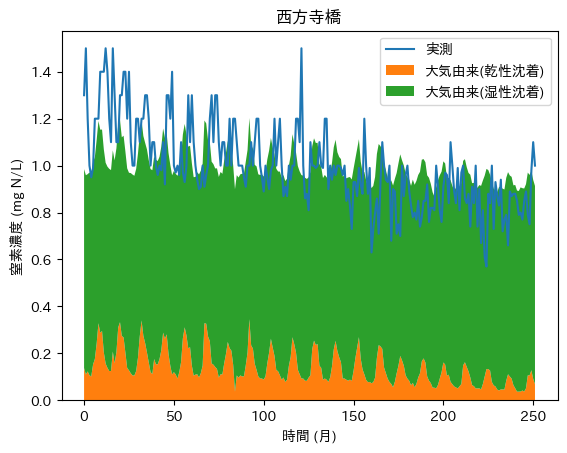

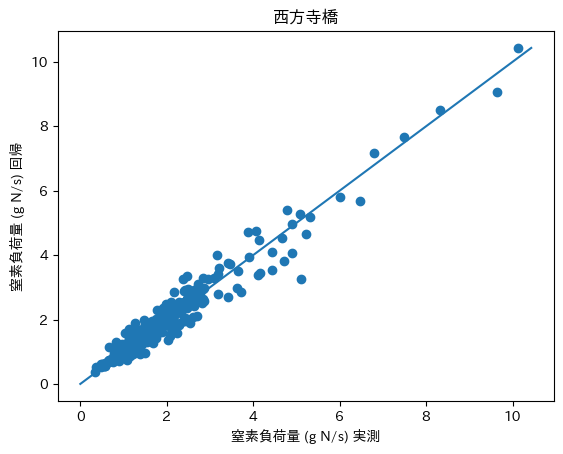

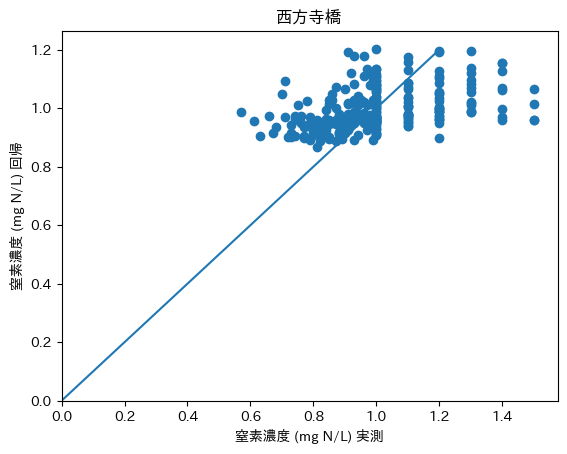

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[1.17499311 0.70870519 0.47879998 0.34753576 0.26506106 0.20961859
 0.17042503 0.14161795 0.11977716 0.10279303]


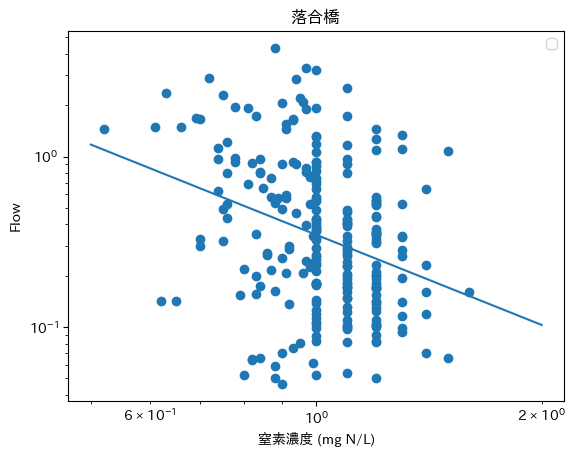

-1.7574189612166928 -1.0568877182252527 [[ 1.         -0.31474934]
 [-0.31474934  1.        ]]


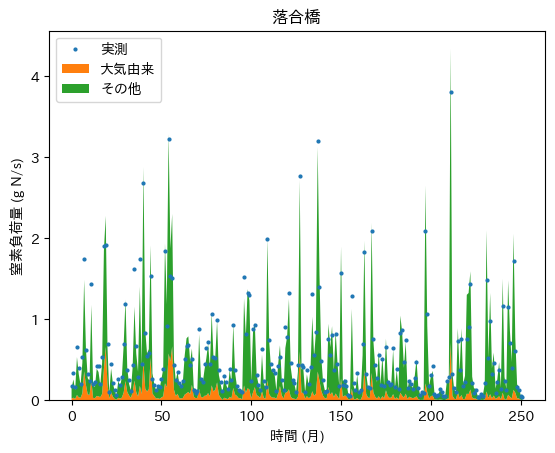

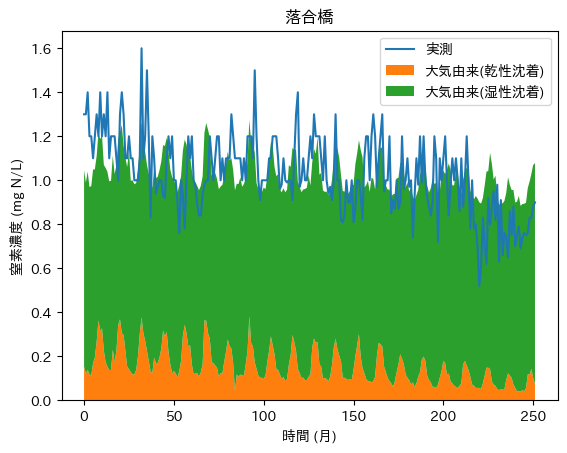

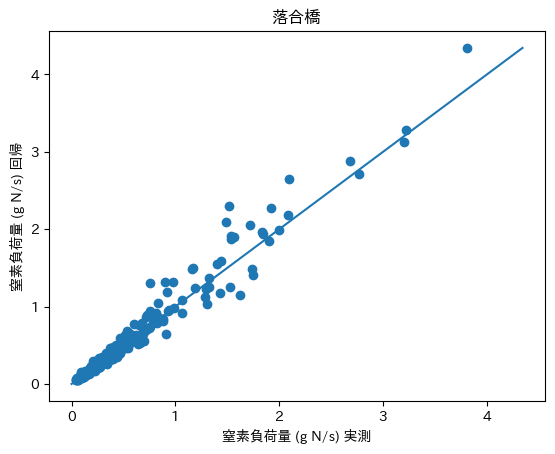

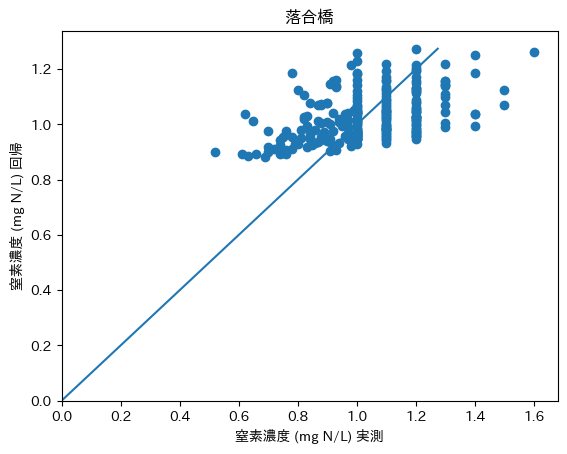

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[2.99980193 2.75048775 2.57146498 2.43387741 2.32330821 2.23159733
 2.15371228 2.08634792 2.0272264  1.97471679]


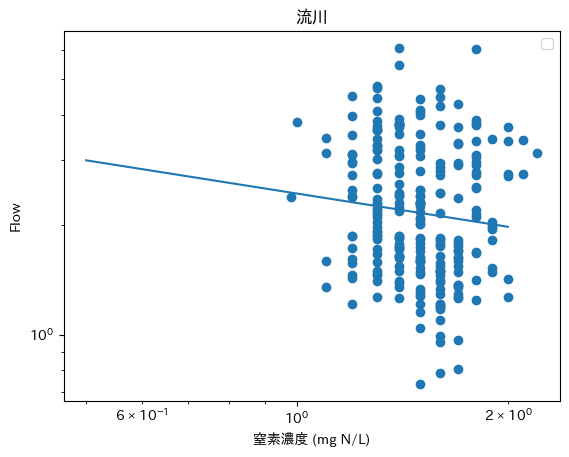

-0.3016107441718878 0.8894856258087043 [[ 1.         -0.07632405]
 [-0.07632405  1.        ]]


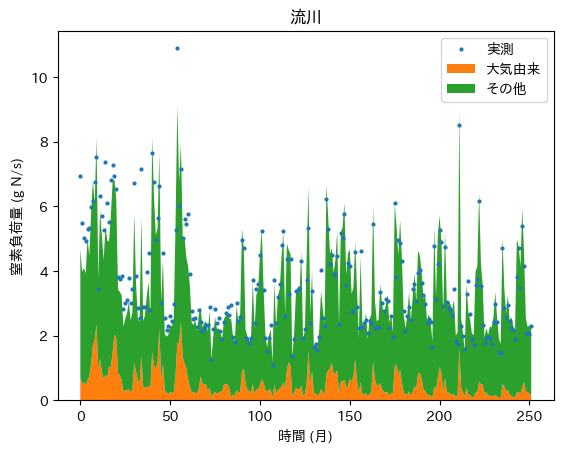

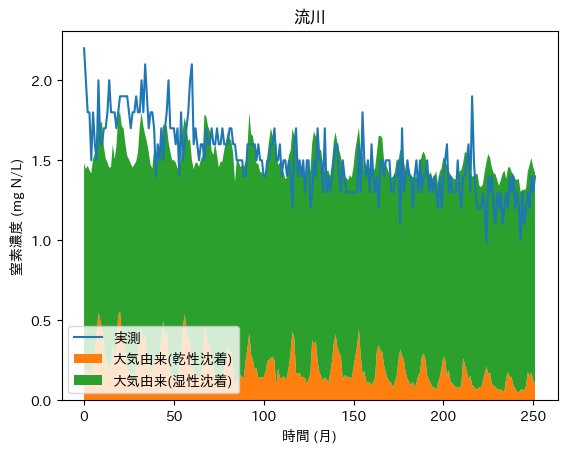

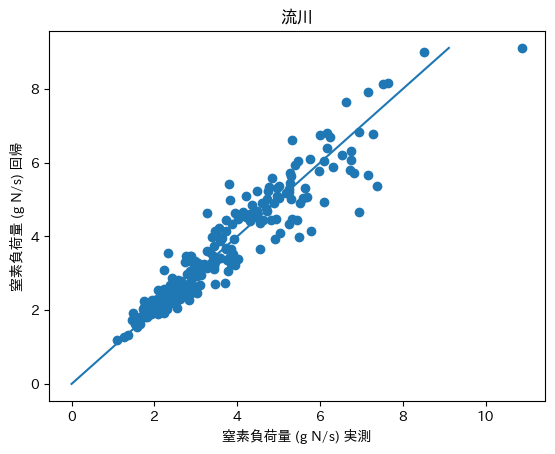

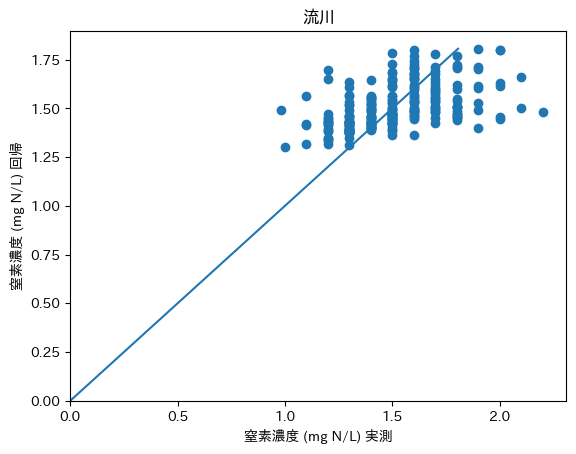

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[4.33253889 4.27630738 4.23319391 4.19829051 4.16900472 4.1438014
 4.12169699 4.10202385 4.08430824 4.06820197]


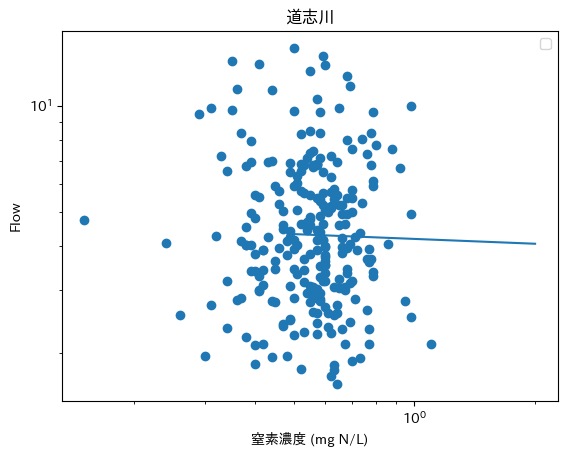

-0.0454106971210797 1.4346774214361762 [[ 1.         -0.03011172]
 [-0.03011172  1.        ]]


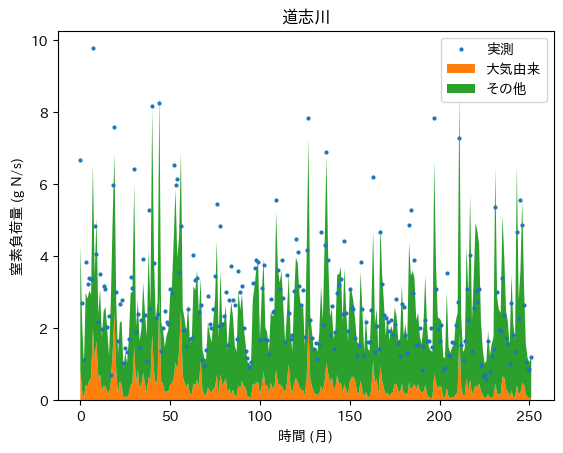

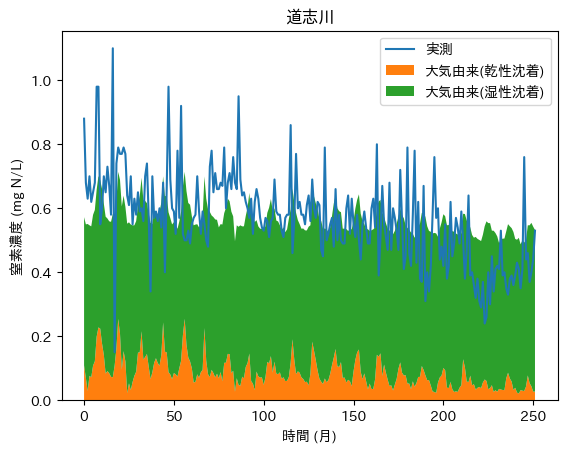

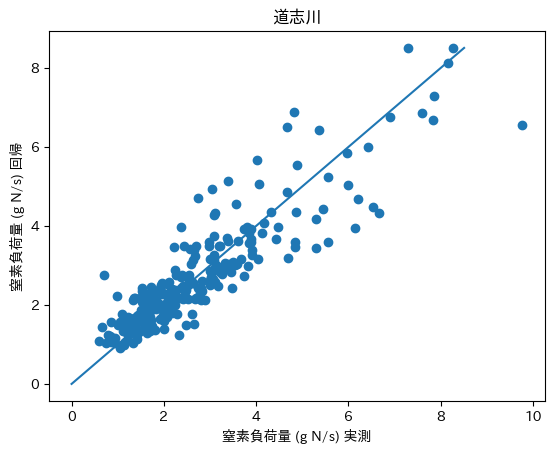

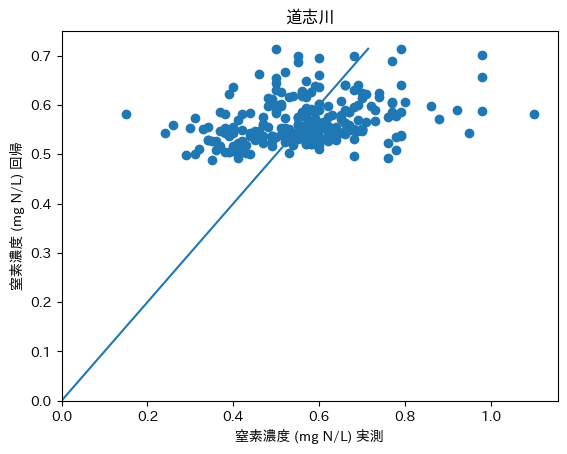

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[0.9974153  1.0585303  1.10850199 1.15107808 1.18834895 1.22160851
 1.25171735 1.27927889 1.30473378 1.32841429]


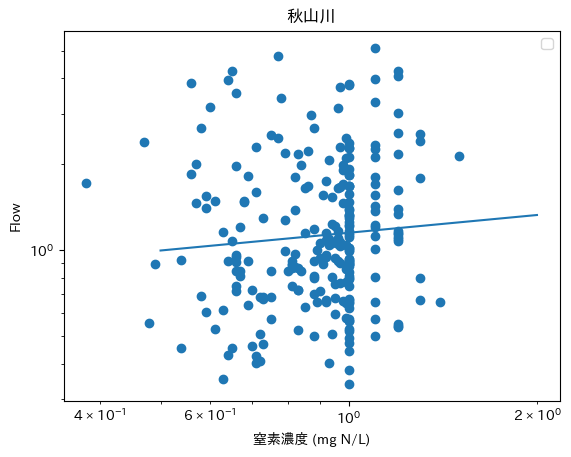

0.20671945294468308 0.14069896140217109 [[1.         0.06771223]
 [0.06771223 1.        ]]


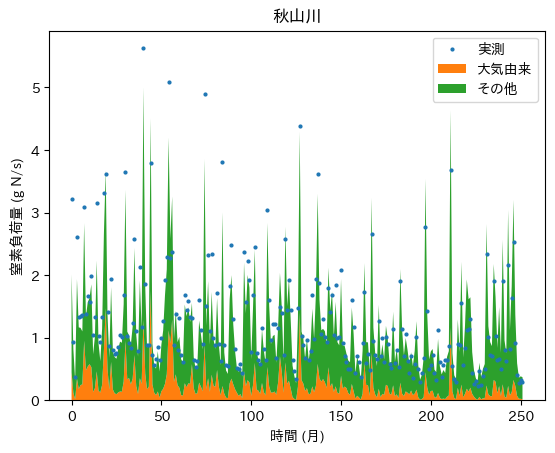

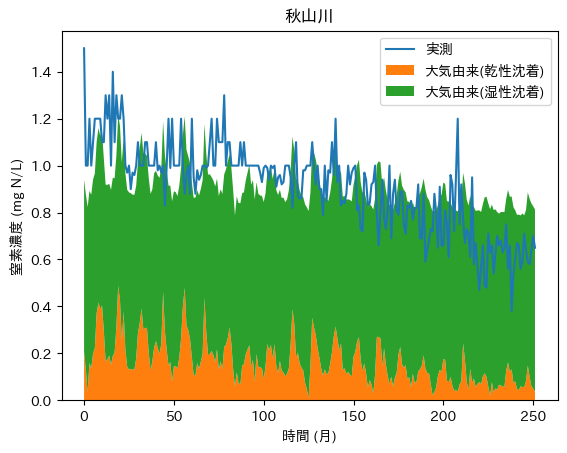

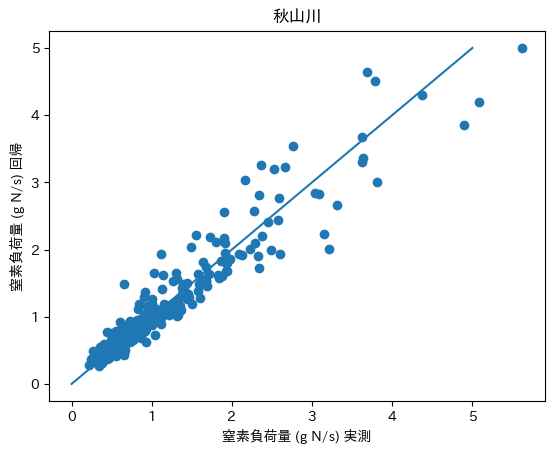

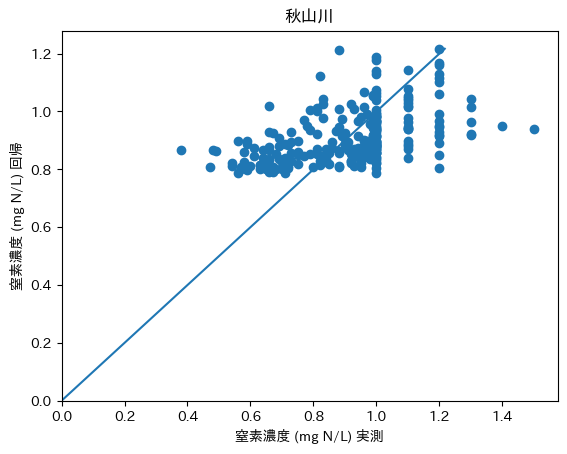

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[56.09983807 48.16669385 42.79437337 38.85280339 35.80486502 33.35858267
 31.33991999 29.63789972 28.17800329 26.90810496]


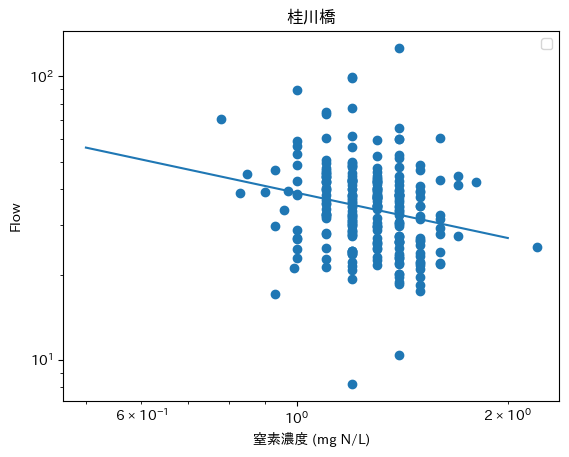

-0.5299779078405353 3.6597802335070804 [[ 1.         -0.19726978]
 [-0.19726978  1.        ]]


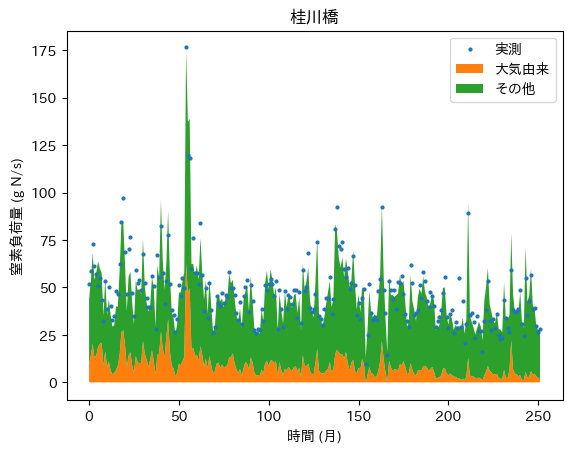

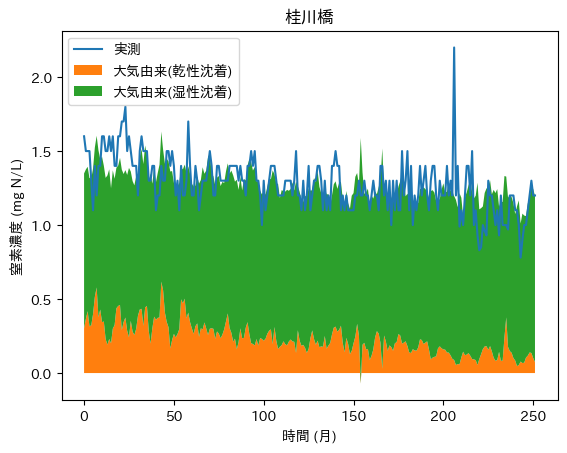

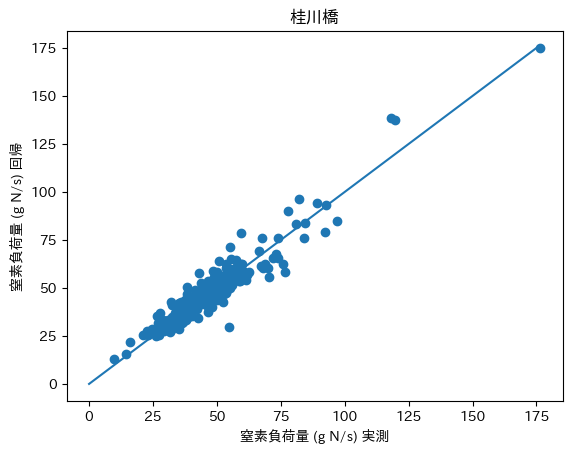

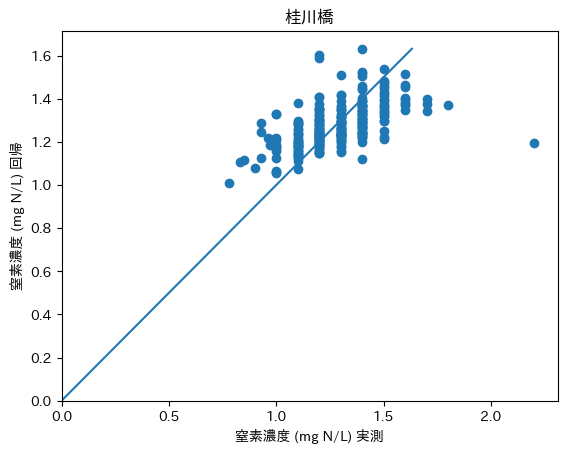

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[2.52490514 2.1365417  1.87693775 1.6884215  1.54388391 1.42872018
 1.33429044 1.25512123 1.18755842 1.12905911]


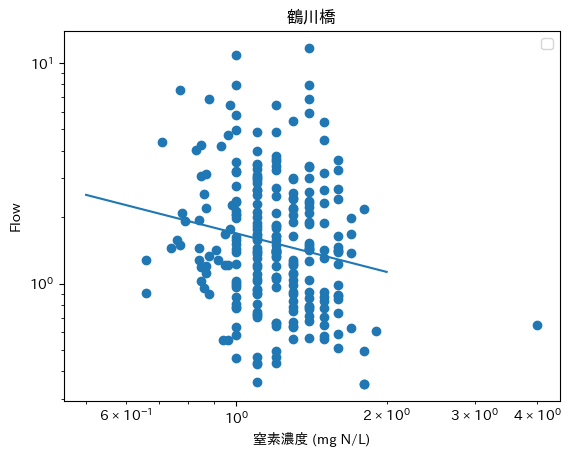

-0.5805540840390366 0.5237940687505014 [[ 1.         -0.13081494]
 [-0.13081494  1.        ]]


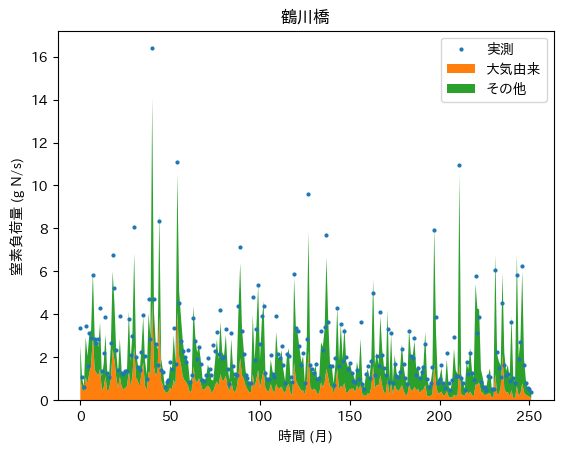

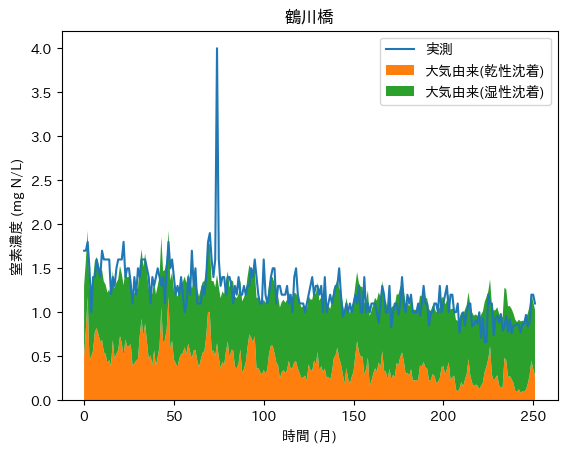

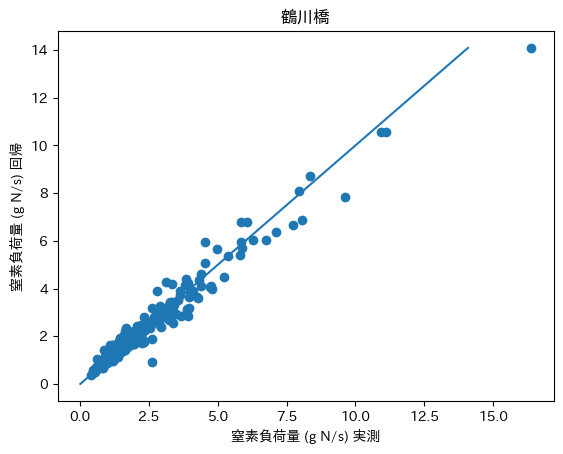

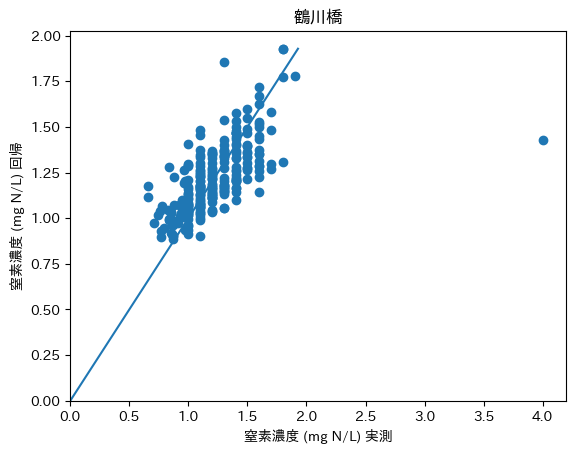

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[1.55812989 1.62103882 1.67157868 1.71404024 1.75078138 1.78324399
 1.81237729 1.838841   1.86311306 1.88555136]


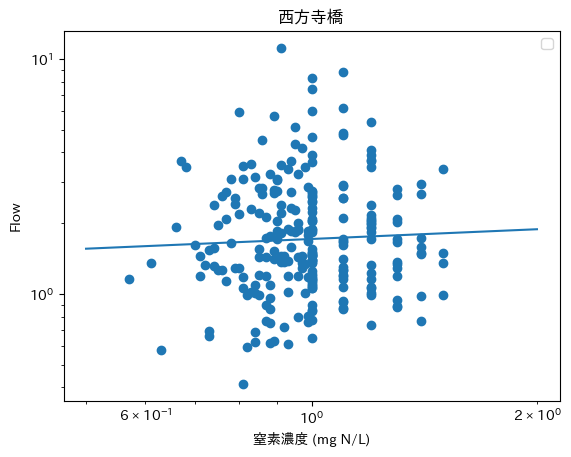

0.13758547311443492 0.5388532966740087 [[1.         0.00709625]
 [0.00709625 1.        ]]


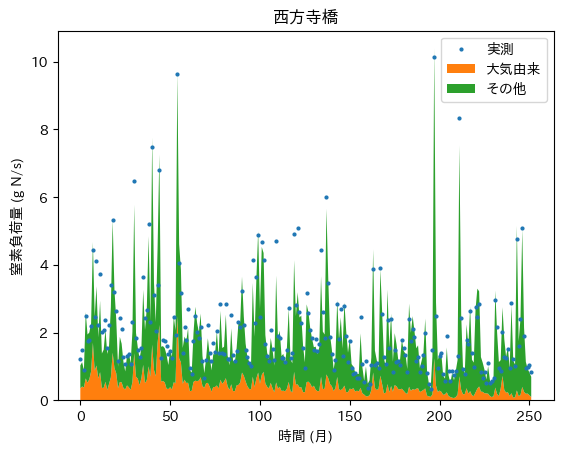

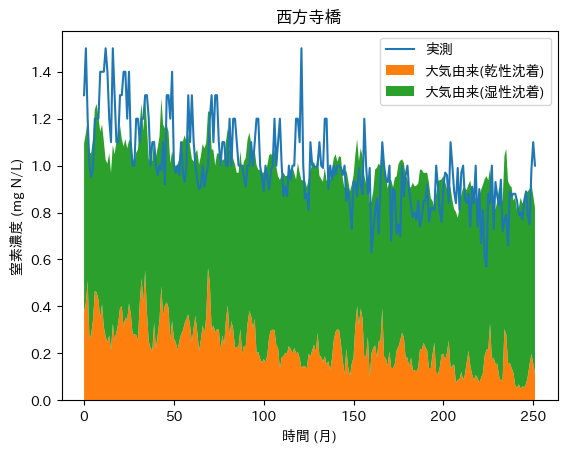

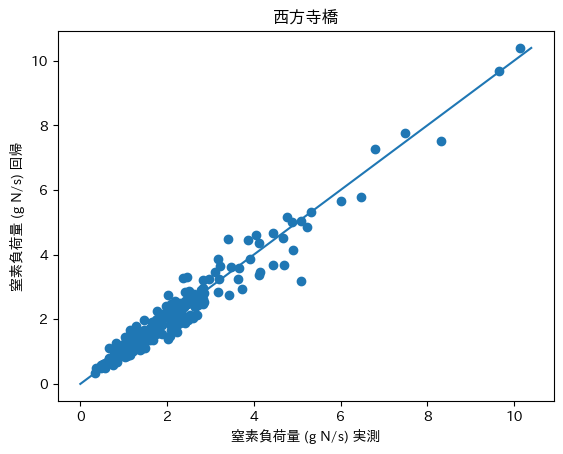

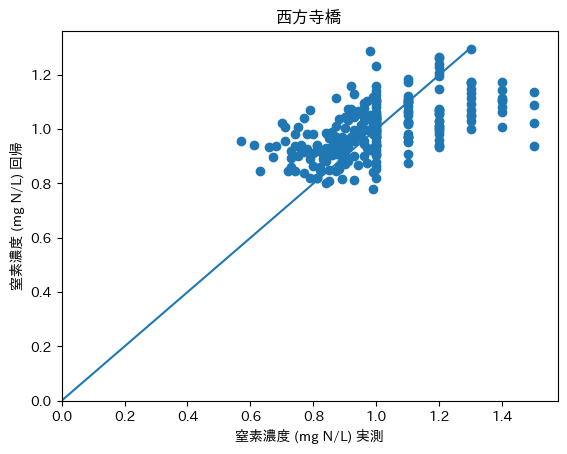

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[1.17499311 0.70870519 0.47879998 0.34753576 0.26506106 0.20961859
 0.17042503 0.14161795 0.11977716 0.10279303]


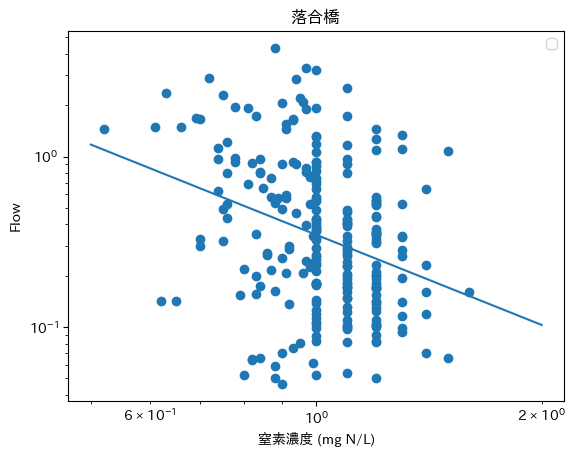

-1.7574189612166928 -1.0568877182252527 [[ 1.         -0.31474934]
 [-0.31474934  1.        ]]


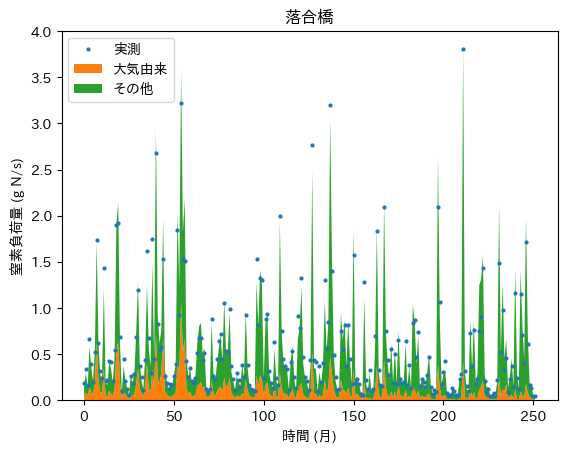

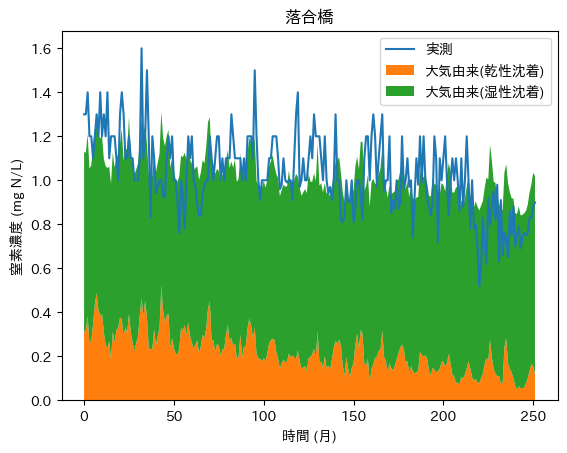

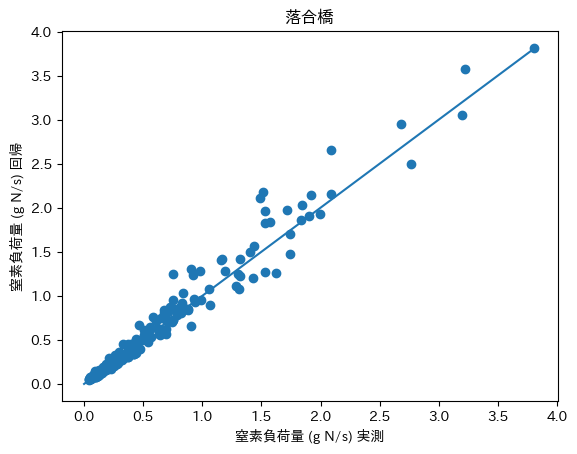

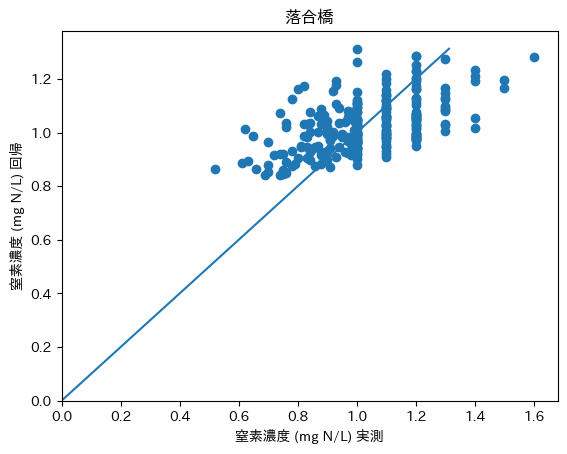

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[2.99980193 2.75048775 2.57146498 2.43387741 2.32330821 2.23159733
 2.15371228 2.08634792 2.0272264  1.97471679]


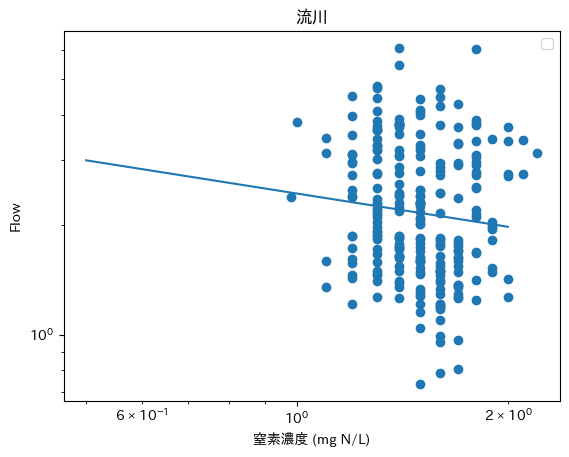

-0.3016107441718878 0.8894856258087043 [[ 1.         -0.07632405]
 [-0.07632405  1.        ]]


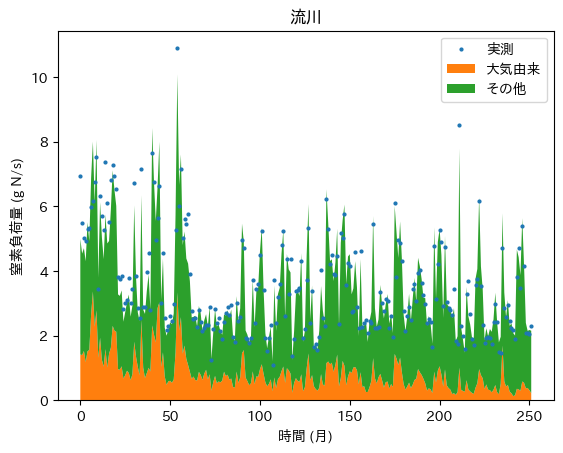

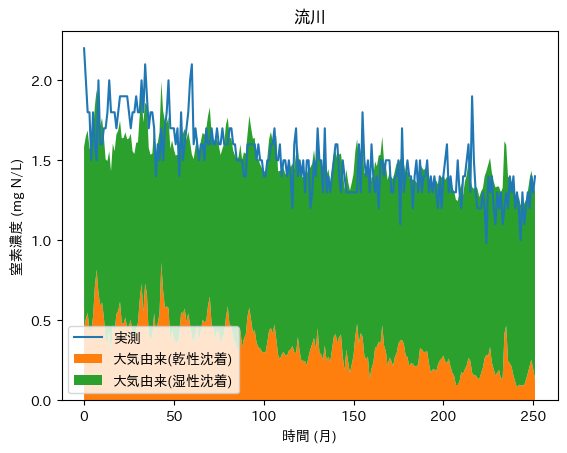

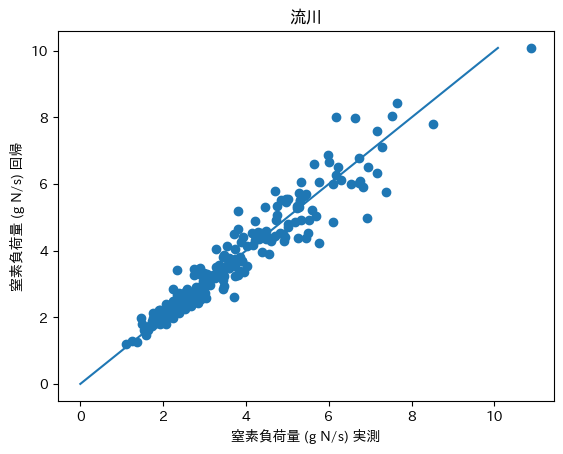

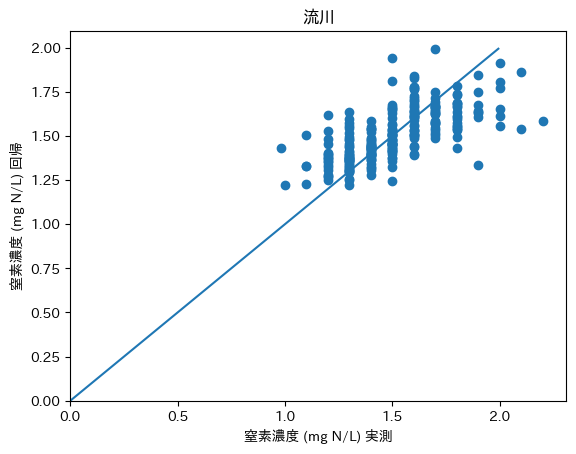

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[4.33253889 4.27630738 4.23319391 4.19829051 4.16900472 4.1438014
 4.12169699 4.10202385 4.08430824 4.06820197]


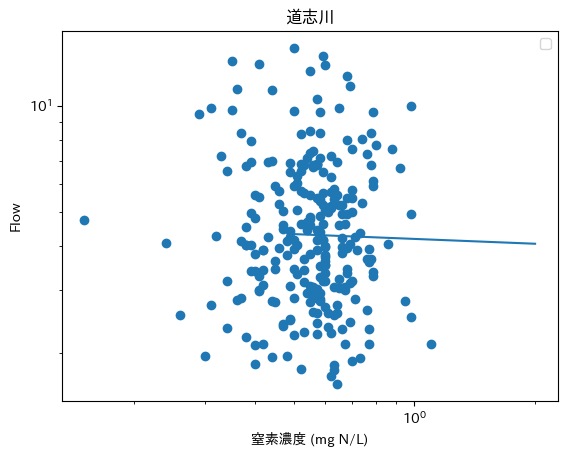

-0.0454106971210797 1.4346774214361762 [[ 1.         -0.03011172]
 [-0.03011172  1.        ]]


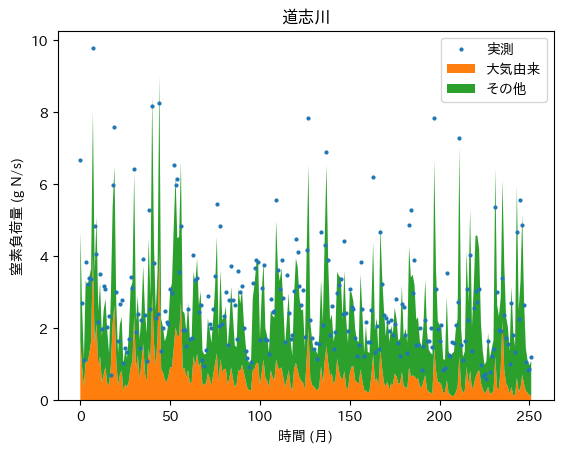

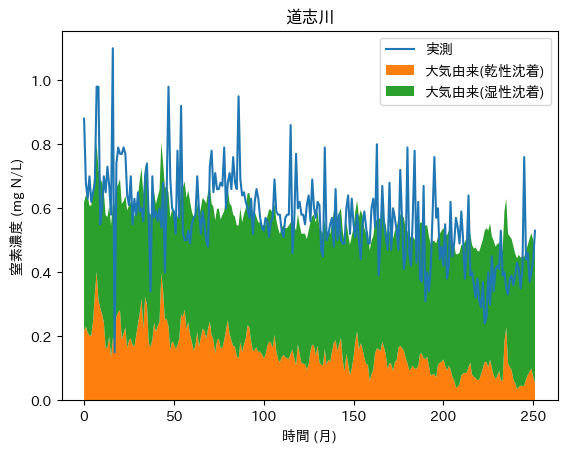

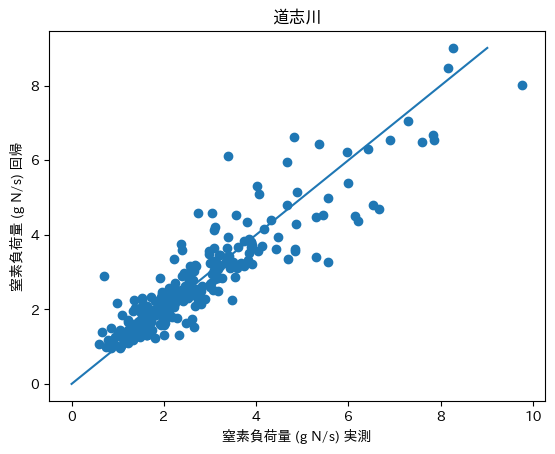

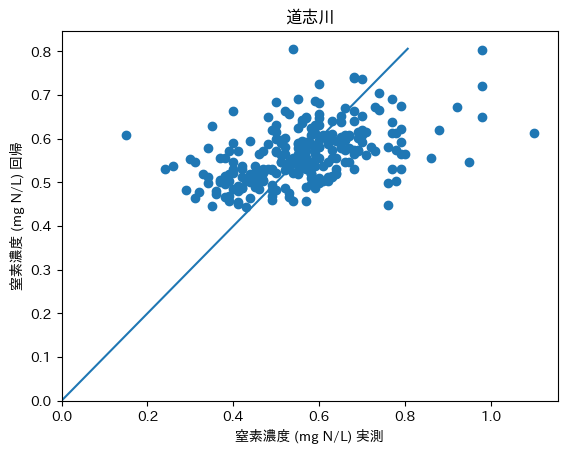

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[0.5        0.66666667 0.83333333 1.         1.16666667 1.33333333
 1.5        1.66666667 1.83333333 2.        ]
[0.9974153  1.0585303  1.10850199 1.15107808 1.18834895 1.22160851
 1.25171735 1.27927889 1.30473378 1.32841429]


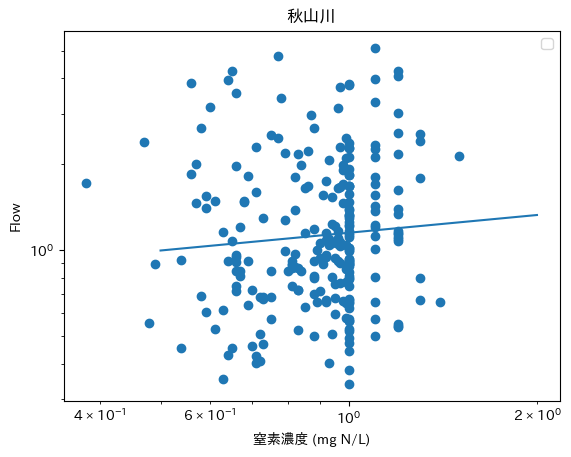

0.20671945294468308 0.14069896140217109 [[1.         0.06771223]
 [0.06771223 1.        ]]


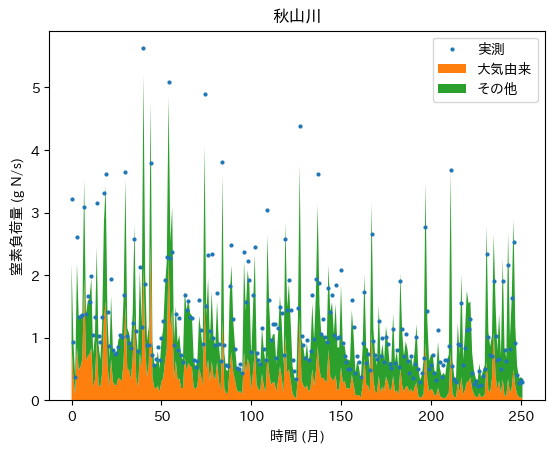

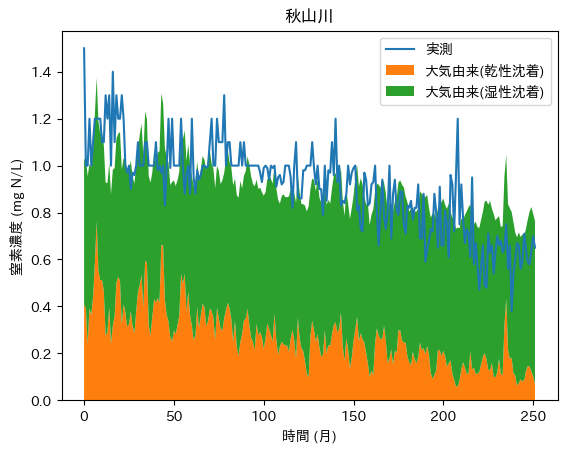

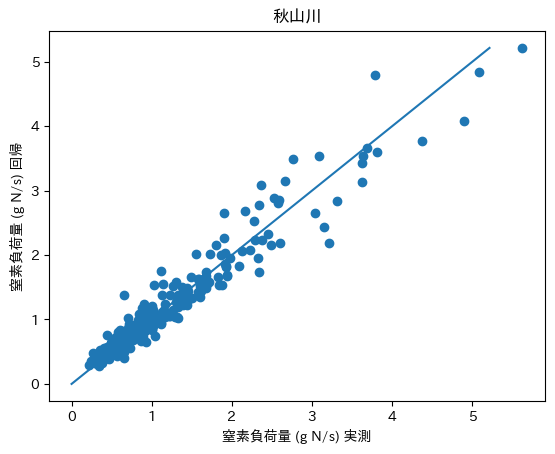

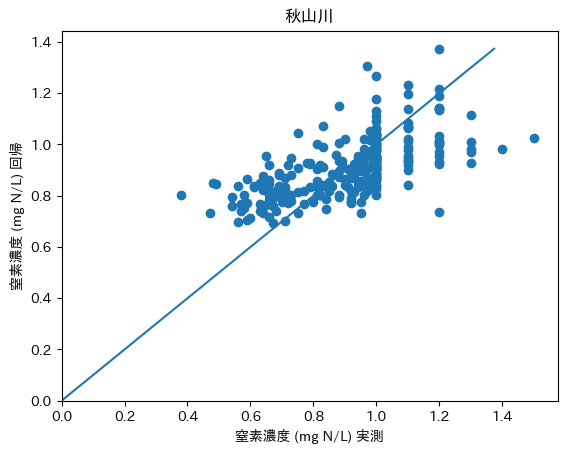

bridge	station	B	C	D	E	rmse	corr	air	r^2
昭和橋	19202030	23.019	21.288	0.339	0.352	0.255	0.719	38.860	0.516
富士見橋	19202030	-15.949	16.849	-0.051	0.950	0.120	0.438	12.565	0.192
大月橋	19204010	0.979	15.575	0.357	0.909	0.153	0.686	21.517	0.471
桂川橋	19206010	-87.030	8.211	5.579	0.938	0.157	0.507	12.675	0.257
鶴川橋	19206010	1.449	7.040	0.059	0.920	0.264	0.478	19.576	0.228
西方寺橋	19206010	-0.082	4.663	-0.025	0.874	0.164	0.405	13.548	0.164
落合橋	19206010	-0.003	5.119	0.008	0.838	0.154	0.485	14.558	0.236
流川	19206010	-4.083	8.939	0.247	1.176	0.189	0.502	13.402	0.252
道志川	19206010	-5.986	4.420	0.137	0.445	0.133	0.319	14.533	0.102
秋山川	19206010	-2.601	8.132	0.025	0.721	0.165	0.480	17.177	0.230
桂川橋	19204010	-174.114	17.987	6.752	0.837	0.150	0.564	17.682	0.318
鶴川橋	19204010	8.528	16.320	-0.023	0.813	0.233	0.631	33.214	0.399
西方寺橋	19204010	6.587	8.664	-0.107	0.832	0.150	0.552	23.075	0.305
落合橋	19204010	0.273	10.858	0.006	0.782	0.147	0.549	20.785	0.302
流川	19204010	2.405	17.981	0.128	1.095	0.162	0.672	22.490	0.451
道志川	

In [26]:
import numpy as np
import scipy
import japanize_matplotlib
import plotly.graph_objects as go
import plotly.io as pio


def trend(cF, B, C, D, E):
    c, F = cF
    return (c * (B + C * F) + D + E * F) / F


bridges = [
    ("昭和橋", 19202030),
    ("富士見橋", 19202030),
    ("大月橋", 19204010),
    ("桂川橋", 19206010),
    ("鶴川橋", 19206010),
    ("西方寺橋", 19206010),
    ("落合橋", 19206010),
    ("流川", 19206010),
    ("道志川", 19206010),
    ("秋山川", 19206010),
    ("桂川橋", 19204010),
    ("鶴川橋", 19204010),
    ("西方寺橋", 19204010),
    ("落合橋", 19204010),
    ("流川", 19204010),
    ("道志川", 19204010),
    ("秋山川", 19204010),
]


for bridge, station in bridges:
    flowcol = f"('{bridge}', '流量')"  # 単位はm3/s
    noxcol = f"('{bridge}', '全窒素')"  # 単位はppm ~ g/m3

    # NOX in the air
    c = nox[station].ffill()

    # River flow
    F = flows[flowcol]

    # N load
    N = flows[flowcol] * flows[noxcol]

    # river N conc.
    cr = flows[noxcol]

    plt.scatter(cr, F)
    plt.title(bridge)
    plt.xlabel("窒素濃度 (mg N/L)")
    plt.ylabel("Flow")
    plt.xscale("log")
    plt.yscale("log")
    popt, pcov = scipy.optimize.curve_fit(lambda logcr, A,B:A*logcr+B,np.log(cr), np.log(F))
    A,B=popt
    X = np.linspace(0.5,2.0, 10)
    Y = np.exp(A*np.log(X)+B)
    print(X)
    print(Y)
    plt.plot(X,Y,"-")
    plt.legend()
    plt.show()
    print(A,B,np.corrcoef(cr,F))

    popt, pcov = scipy.optimize.curve_fit(trend, (c, F), N / F)
    B, C, D, E = popt

    X = range(len(N))
    Y = N
    plt.plot(X, Y, "o", markersize=2, label="実測")
    plt.stackplot(
        X, c * (B + C * F), D + E * F, baseline="zero", labels=["大気由来", "その他"]
    )
    # plt.yscale("log")
    plt.title(bridge)
    plt.xlabel("時間 (月)")
    plt.ylabel("窒素負荷量 (g N/s)")
    # plt.ylim(0,100)
    plt.legend()
    plt.show()

    X = range(len(N))
    Y = N / F
    plt.plot(X, Y, "-", markersize=2, label="実測")
    plt.stackplot(
        X,
        trend((c, F), B, C, 0, 0),
        trend((c, F), 0, 0, D, E),
        baseline="zero",
        labels=["大気由来(乾性沈着)", "大気由来(湿性沈着)", "その他"],
    )
    # plt.yscale("log")
    plt.title(bridge)
    plt.xlabel("時間 (月)")
    plt.ylabel("窒素濃度 (mg N/L)")
    # plt.ylim(0,100)
    plt.legend()
    plt.show()

    plt.scatter(N, trend((c, F), B, C, D, E) * F)
    X = np.linspace(0, np.max(trend((c, F), B, C, D, E) * F), 10)
    plt.plot(X, X, "-")
    plt.title(bridge)
    plt.xlabel("窒素負荷量 (g N/s) 実測")
    plt.ylabel("窒素負荷量 (g N/s) 回帰")
    # plt.legend()
    plt.show()

    plt.scatter(N / F, trend((c, F), B, C, D, E))
    X = np.linspace(0, np.max(trend((c, F), B, C, D, E)), 10)
    plt.plot(X, X, "-")
    plt.title(bridge)
    plt.xlabel("窒素濃度 (mg N/L) 実測")
    plt.ylabel("窒素濃度 (mg N/L) 回帰")
    plt.xlim(0, None)
    plt.ylim(0, None)
    # plt.legend()
    plt.show()

print("bridge\tstation\tB\tC\tD\tE\trmse\tcorr\tair\tr^2")
for bridge, station in bridges:
    flowcol = f"('{bridge}', '流量')"  # 単位はm3/s
    noxcol = f"('{bridge}', '全窒素')"  # 単位はppm ~ g/m3

    # NOX in the air
    c = nox[station].ffill()

    # River flow
    F = flows[flowcol]

    # N load
    N = flows[flowcol] * flows[noxcol]

    popt, pcov = scipy.optimize.curve_fit(trend, (c, F), N / F)
    B, C, D, E = popt

    print(f"{bridge}\t{station}\t{B:.3f}\t{C:.3f}\t{D:.3f}\t{E:.3f}\t", end="")

    rmse = np.mean((N / F - trend((c, F), B, C, D, E)) ** 2) ** 0.5

    coeff = np.corrcoef(N / F, trend((c, F), B, C, D, E))[0, 1]
    air = np.mean(trend((c, F), B, C, 0, 0) / trend((c, F), B, C, D, E) * 100)

    xdata = (c, F)
    ydata = N / F
    residuals = ydata - trend(xdata, *popt)
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((ydata - np.mean(ydata)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)

    print(f"{rmse:.3f}\t{coeff:.3f}\t{air:.3f}\t{r_squared:.3f}")

昭和橋では、流量と窒素濃度がきれいに反比例する。水量が増加すると濃度が下がる傾向が明らか。

下流ではそんなきれいな関係はない。